# 라이브러리

In [ ]:
from collections import defaultdict, Counter
from google.colab import drive
from scipy.stats import norm
from sklearn.linear_model import LinearRegression, LogisticRegression
from statsmodels.stats.power import NormalIndPower
from statsmodels.stats.proportion import proportion_effectsize
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from urllib.parse import urlparse, parse_qs, unquote_plus
from wordcloud import WordCloud
from functools import reduce

import IPython.display as disp
import matplotlib as mpl
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import re
import os
import requests
import seaborn as sns
import warnings
import gdown

warnings.filterwarnings('ignore')
mpl.rc('font', family='Nanum Gothic')
mpl.rcParams['axes.unicode_minus'] = False

# 데이터셋 읽어오기

## 활용 데이터셋
|데이터셋명	| 설명	|주요 컬럼
|-|-|-|
|log_df	|유저 로그	|user_uuid, URL, timestamp, response_code, method
company_df|	기업 정보	|company_uuid, cdate, view_count, follow_count, reference_count
company_fund_df|	기업 투자 정보	|company_uuid, round_type, raised
application_df	|지원서 작성 로그	|company_uuid, job_uuid, application_uuid
job_df	|채용공고 정보	|company_uuid, job_uuid, cdate, start_date, end_date, allow_remote, can_show_salary, career_type_string, job_field
job_bookmark_df	|채용공고 북마크 로그|	job_uuid, cdate
job_address_df	|채용공고별 근무지 정보|	job_uuid, address

In [ ]:
# 공유 폴더로부터 파일 불러오기
def read_files(url, filename="log_df_labeled.csv"):
    file_id = url.split("/")[-2]
    path = "https://drive.google.com/uc?id="+file_id

    try:
        response = requests.head(path, allow_redirects=True)
        content_type = response.headers.get("Content-Type", "")

        if "text/html" in content_type:
            raise ValueError("Google Drive returned HTML instead of CSV")

        return pd.read_csv(path)
    except Exception as e:
        # 에러 시 파일 다운로드 후 읽기
        print(f"Error: {e}")
        if os.path.exists(filename):
            os.remove(filename)

        gdown.download(path, filename, quiet=False)
        return pd.read_csv(filename)

urls = {
    "company_df": "link to company file",
    "company_fund_df": "link to company file",
    "job_df": "link to job file",
    "job_address_df": "link to job address file",
    "job_bookmark_df": "link to job bookmark file",
    "application_df": "link to application file",
    "log_df": "link to log file"
}

company_df = read_files(urls["company_df"])
company_fund_df = read_files(urls["company_fund_df"])
job_df = read_files(urls["job_df"])
job_address_df = read_files(urls["job_address_df"])
job_bookmark_df = read_files(urls["job_bookmark_df"])
application_df = read_files(urls["application_df"])
log_df = read_files(urls["log_df"])

Error: Google Drive returned HTML instead of CSV


Downloading...
From (original): https://drive.google.com/uc?id=1xtwGKSTVY08NnwC7U9tSl3ZESmJKshBT
From (redirected): https://drive.google.com/uc?id=1xtwGKSTVY08NnwC7U9tSl3ZESmJKshBT&confirm=t&uuid=42755a68-7a5f-4e2e-8559-93176c0c9b85
To: /content/log_df_labeled.csv
100%|██████████| 2.99G/2.99G [00:44<00:00, 66.7MB/s]


In [ ]:
# 지원서, 채용공고, 북마크 2022-2023 데이터만 추출
company_df['cdate'] = pd.to_datetime(company_df['cdate'], format="mixed", utc=True)
company_df['mdate'] = pd.to_datetime(company_df['mdate'], format="mixed", utc=True)

job_df['cdate'] = pd.to_datetime(job_df['cdate'], format="mixed", utc=True)
job_df['mdate'] = pd.to_datetime(job_df['mdate'], format="mixed", utc=True)
job_df = job_df[(job_df["cdate"] >= "2021-12-31 15:00:00") & (job_df["cdate"] < "2023-12-31 15:00:00")]
job_df.rename({"cdate": "cdate_job", "mdate": "mdate_job"}, inplace=True, axis=1)
job_bookmark_df['cdate'] = pd.to_datetime(job_bookmark_df['cdate'], format="mixed", utc=True)
job_bookmark_df = job_bookmark_df[(application_df["cdate"] >= "2021-12-31 15:00:00") & (job_bookmark_df["cdate"] < "2023-12-31 15:00:00")]
job_bookmark_df.rename({"cdate": "cdate_bookmark"}, inplace=True, axis=1)

application_df['cdate'] = pd.to_datetime(application_df['cdate'], format="mixed", utc=True)
application_df = application_df[(application_df["cdate"] >= "2021-12-31 15:00:00") & (application_df["cdate"] < "2023-12-31 15:00:00")]
application_df.drop(columns=["Unnamed: 0", "cdate_date", "cdate_hour"], inplace=True)
application_df.rename({"cdate": "cdate_application"}, inplace=True, axis=1)

company_df = company_df.merge(company_fund_df, how="left", on="company_uuid")[[
    "cdate", "mdate", "employee_count", "view_count", "follow_count", "reference_count", "company_uuid", "round_type", "raised", "currency"
]]
company_df.rename({"cdate": "cdate_profile", "mdate": "mdate_profile", "view_count": "view_count_ln"}, inplace=True, axis=1)
# 자연로그 처리된 view count 되돌리기
company_df["view_count"] = np.expm1(company_df["view_count_ln"])

# 1_ 코드인 소개

## 1-1. 특성

**코드인(Code人)**은 대한민국의 대표적인 스타트업·IT 전문 커리어 플랫폼으로, 구직자와 기업간의 매칭을 통해 채용, 구직, 기업 홍보 등 다양한 기능을 제공하는 종합 커리어 서비스이다.

업무 분야 기준 사용자 검색어 데이터를 워드클라우드로  시각화한 이미지.

코드인의 가장 큰 특징은 **스타트업 중심의 특화된 사용자군**을 기반으로 한다는 점이다.

- **스타트업 구직자**
    
    일반적인 취업준비생과는 달리, 코드인 이용자는 스타트업, 테크기업, 디지털 산업군에 특화된 구직자들이 중심이며, 특히
    
    `개발자`, `백엔드` , `프론트엔드` , `앱 개발자` , `기획` 등의 키워드가 상위에 분포한다.
    
    이는 코드인이 IT 전문 중심 커리어 플랫폼임을 보여준다.
    
- **채용 담당자 및 CEO**
    
    스타트업 특성상 소규모 조직의 경우 대표나 핵심 실무자가 직접 채용을 담당하는 경우가 많아, 사용자 입장에서 기업 정보를 투명하게 확인하고 빠르게 소통할 수 있는 구조가 자연스레 형성되어 있다.
    
- **투자자 및 미디어 관계자**
    
    코드인은 유망 스타트업을 탐색하려는 투자자, 미디어 관계자, 업계 종사자 등도 주요 사용자군에 포함되며, 채용을 넘어 스타트업 생태계 전반에서 의미있는 역할을 수행하고 있다.

### 워드 클라우드 검색어 분석


📌 분류: unknown — 검색 수: 82075개
상위 10개 검색어:
- flutter (1496회)
- 프론트엔드 (940회)
- 블록체인 (480회)
- django (437회)
- 자연어처리 (413회)
- react (342회)
- 산업기능요원 (328회)
- 로켓펀치 (310회)
- 인턴 (259회)
- 부산 (226회)


<ipython-input-35-838ce2fb27f6>:49: UserWarning: Glyph 128218 (\N{BOOKS}) missing from font(s) NanumGothic.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128218 (\N{BOOKS}) missing from font(s) NanumGothic.
  fig.canvas.print_figure(bytes_io, **kw)


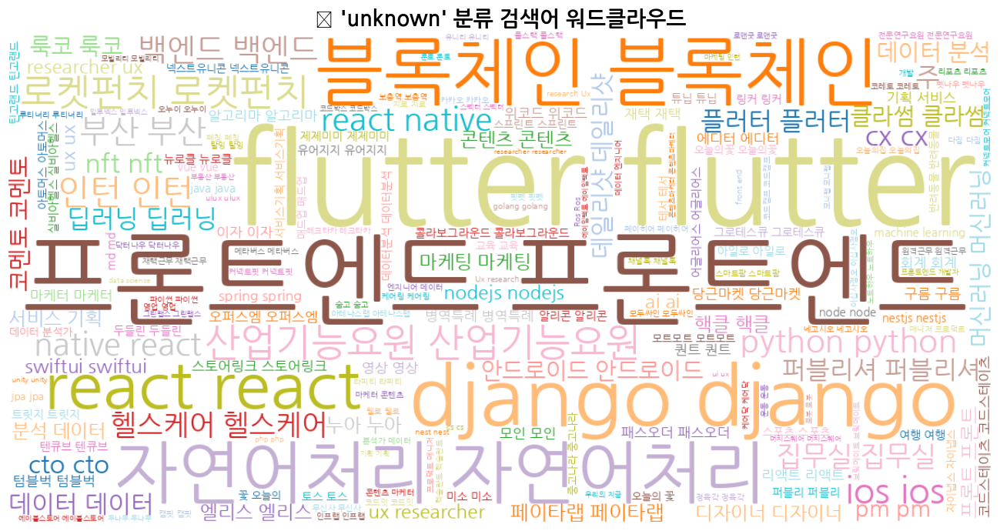


📌 분류: template — 검색 수: 87104개
상위 10개 검색어:
- flutter (1563회)
- 프론트엔드 (1099회)
- 블록체인 (513회)
- django (473회)
- react (413회)
- 산업기능요원 (370회)
- 인턴 (326회)
- 로켓펀치 (319회)
- python (260회)
- 백엔드 (252회)


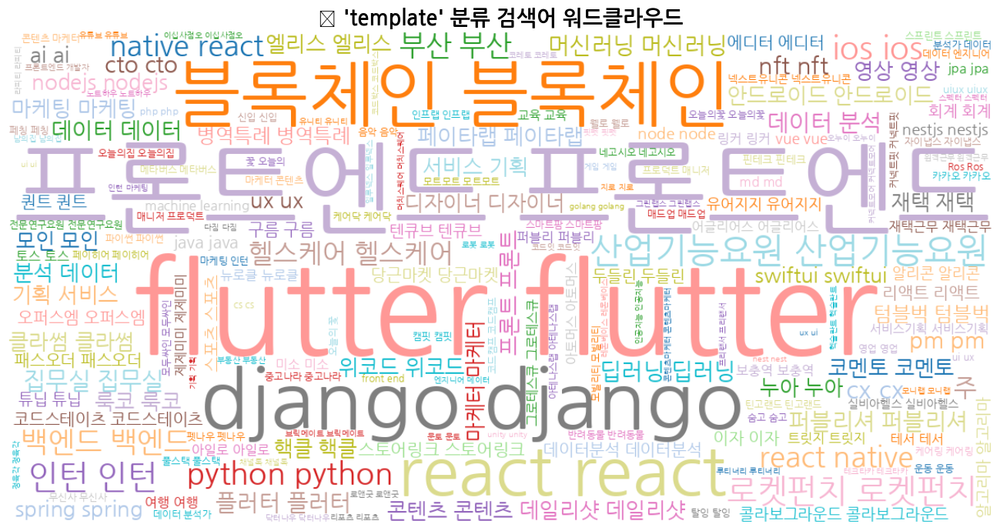


📌 분류: product — 검색 수: 88821개
상위 10개 검색어:
- 포트폴리오 (122회)
- We (91회)
- 개인 (83회)
- NFT (65회)
- My (62회)
- LG (59회)
- AI (53회)
- 쇼핑몰 (53회)
- 2021 (51회)
- 2022 (49회)


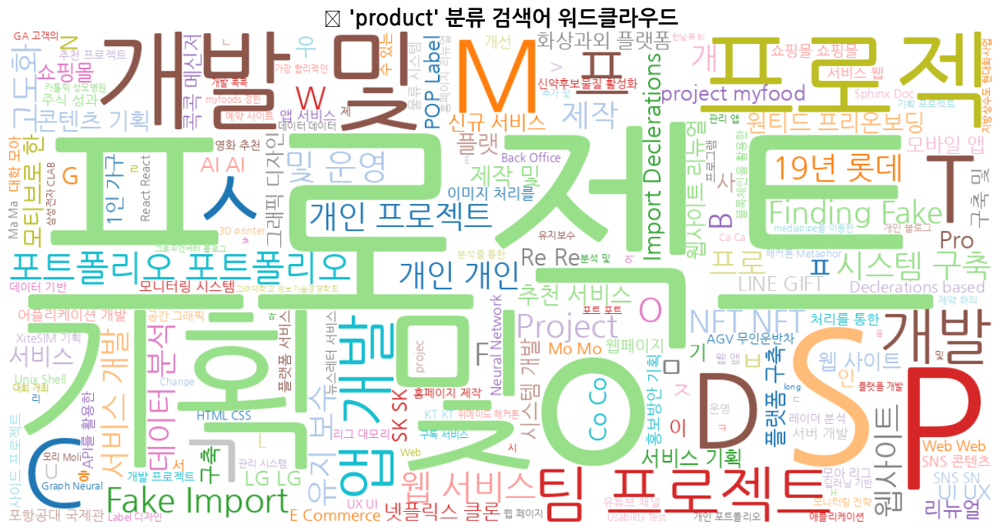


📌 분류: companies — 검색 수: 82319개
상위 10개 검색어:
- 없음 (698회)
- (주) (429회)
- (주 (398회)
- 신입 (323회)
- 개인 (276회)
- 코드스테이츠 (268회)
- 프리랜서 (266회)
- 위코드 (217회)
- 한국 (162회)
- KAIST (139회)


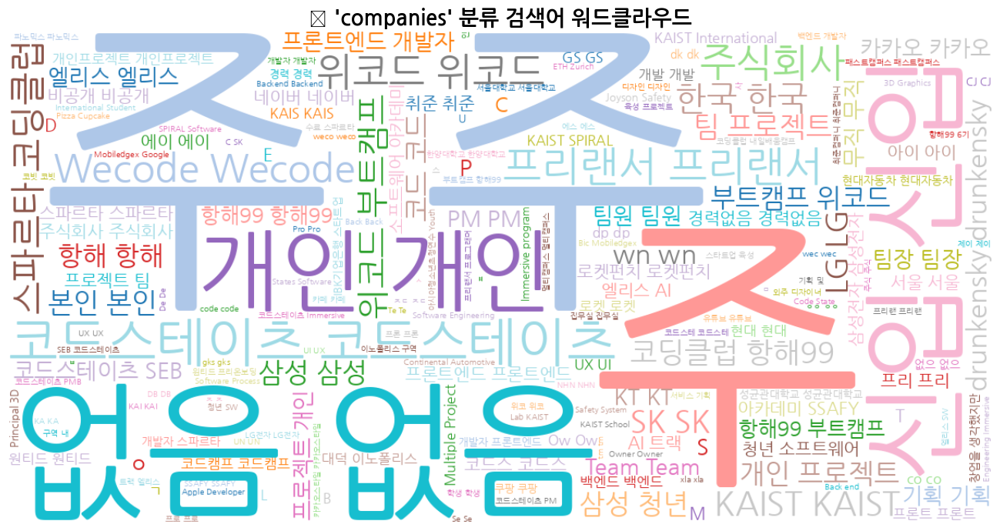


📌 분류: people/job_title — 검색 수: 92240개
상위 10개 검색어:
- 백엔드 (1132회)
- 프론트엔드 (1114회)
- 프론트 (987회)
- 프론 (909회)
- 프론트엔드 개발자 (723회)
- 백엔드 개발자 (714회)
- 인턴 (358회)
- 개발자 (333회)
- 개발 (320회)
- 디자이너 (308회)


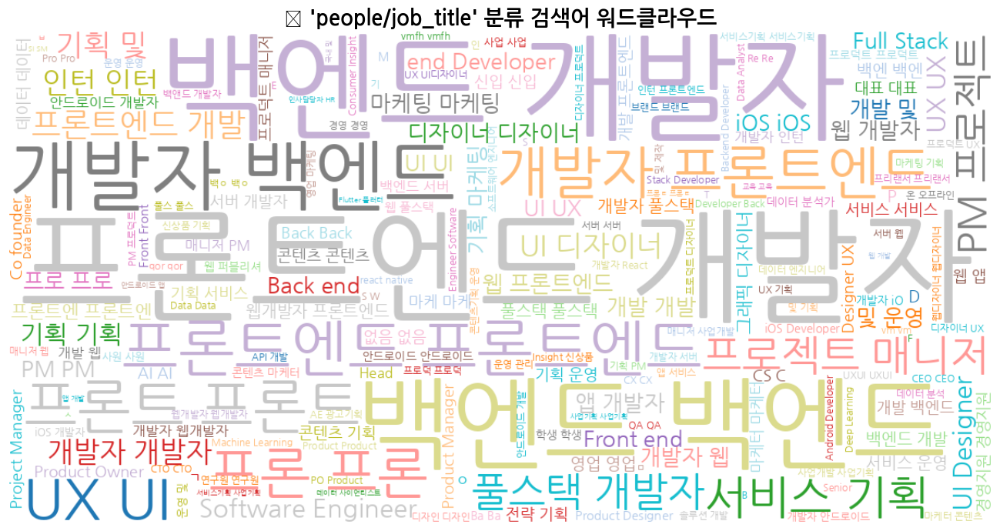


📌 분류: specialty — 검색 수: 125181개
상위 10개 검색어:
- react (1211회)
- re (1151회)
- java (933회)
- reac (919회)
- python (633회)
- spring (626회)
- rea (626회)
- aws (612회)
- React (577회)
- git (562회)


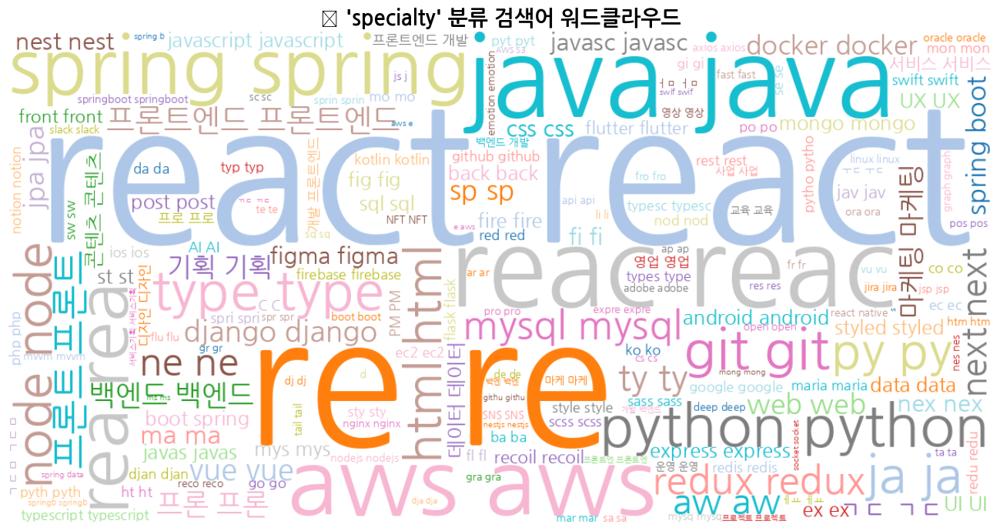


📌 분류: people/schools — 검색 수: 22166개
상위 10개 검색어:
- 한국 (215회)
- 홍익대학교 (121회)
- 서울 (109회)
- 연세대학교 (98회)
- 한양 (96회)
- 건국대학교 (91회)
- 경기대학교 (88회)
- 한양대학교 (87회)
- 중앙대학교 (82회)
- 고려대학교 (72회)


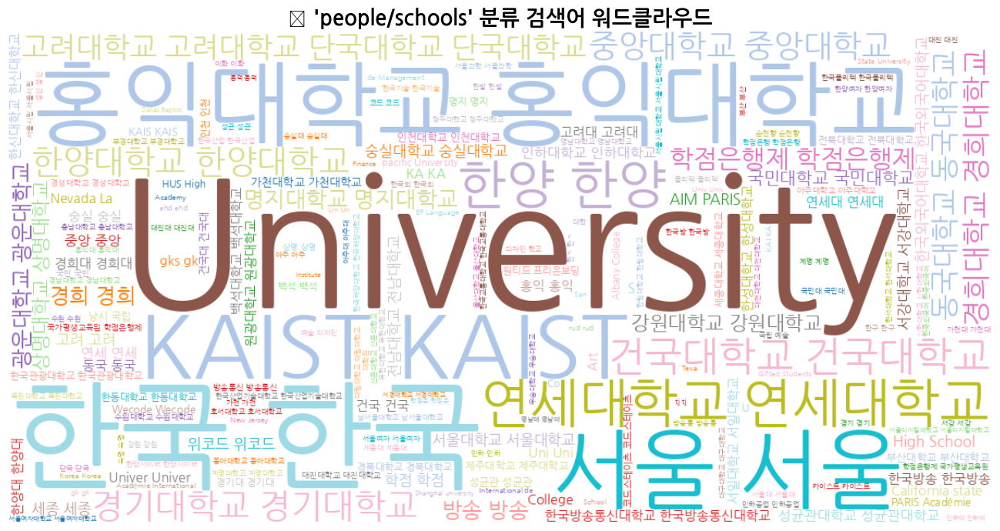


📌 분류: people/major — 검색 수: 17462개
상위 10개 검색어:
- 컴퓨터 (411회)
- 경영 (202회)
- 컴퓨 (184회)
- 컴퓨터공학 (174회)
- 경영학과 (144회)
- 컴퓨터공학과 (116회)
- 경영학 (115회)
- 컴퓨터과학 (81회)
- 컴퓨터공학부 (79회)
- 소프트웨어 (70회)


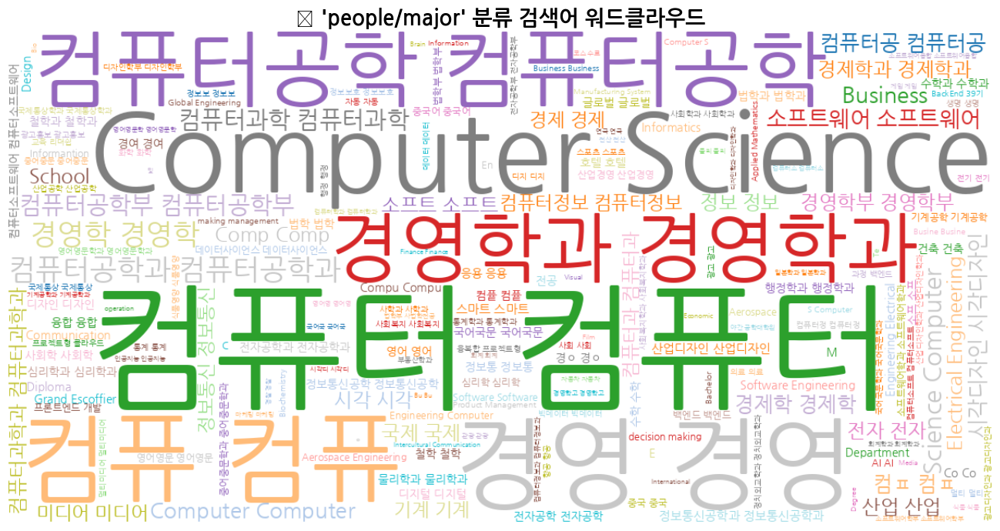


📌 분류: users — 검색 수: 14940개
상위 10개 검색어:
- 개인 (196회)
- 프론트 (49회)
- 개인 프로젝트 (46회)
- 프론트엔드 (45회)
- rla (38회)
- 새 유저 추 (38회)
- 본인 (35회)
- 개인프로젝트 (33회)
- 혼자 (29회)
- dl (27회)


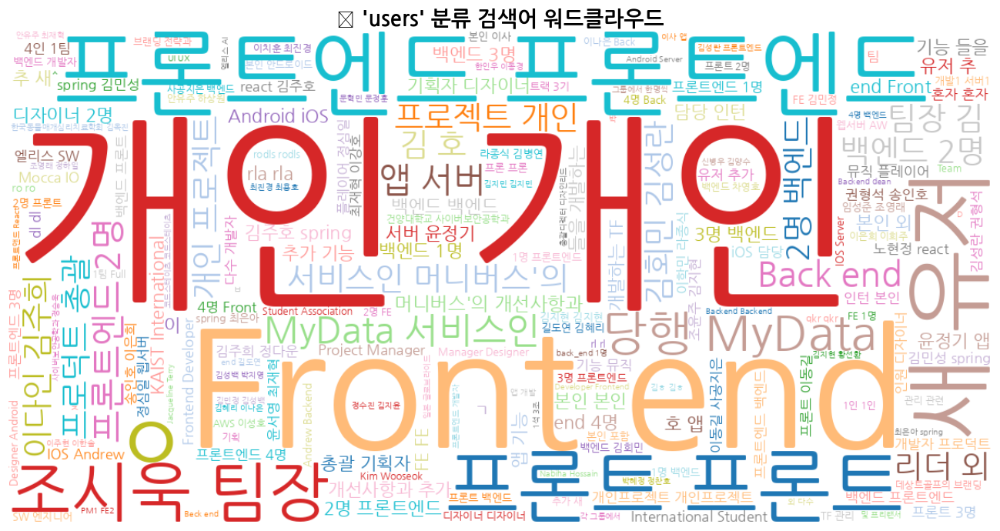


📌 분류: jobs/job_title — 검색 수: 27321개
상위 10개 검색어:
- react (1183회)
- reac (888회)
- re (687회)
- 서울특별시 (641회)
- React (628회)
- rea (614회)
- 부산 (477회)
- ㄱㄷ (427회)
- java (385회)
- 인천 (291회)


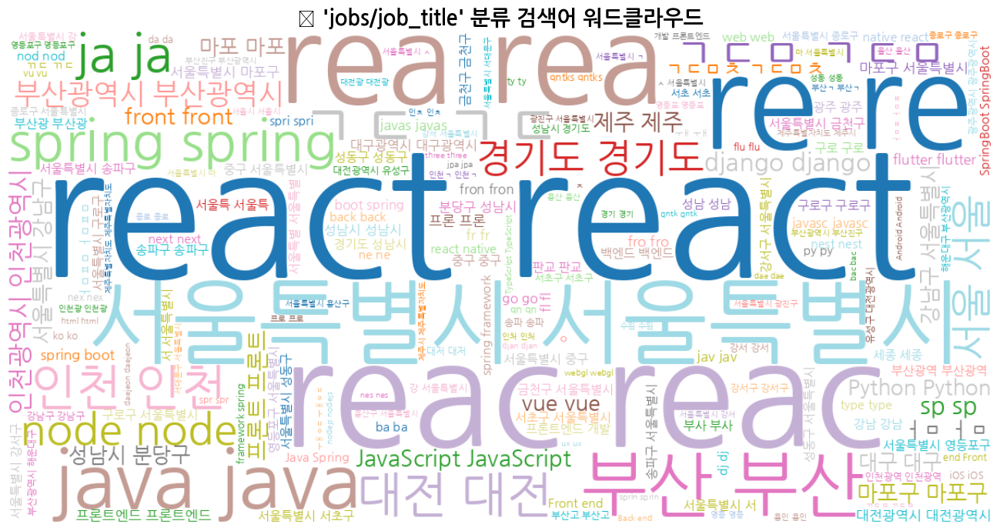


📌 분류: language — 검색 수: 10757개
상위 10개 검색어:
- 영어 (3298회)
- 일본어 (410회)
- 한국어 (335회)
- 중국어 (262회)
- java (254회)
- 영ㅇ (178회)
- dud (170회)
- dudd (157회)
- 한국 (155회)
- ja (153회)


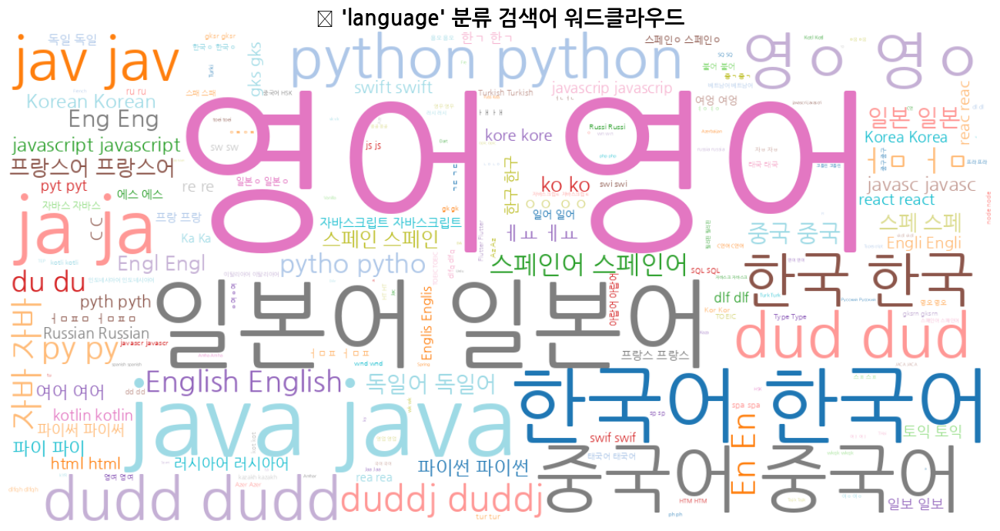


📌 분류: companies/company_id — 검색 수: 4170개
상위 10개 검색어:
- 프론트 (108회)
- 교육 (80회)
- 프론 (68회)
- 부산 (65회)
- 프론트엔드 (59회)
- 웹서비스 (43회)
- 게임 (38회)
- 블록 (38회)
- ai (38회)
- 모바일 (29회)


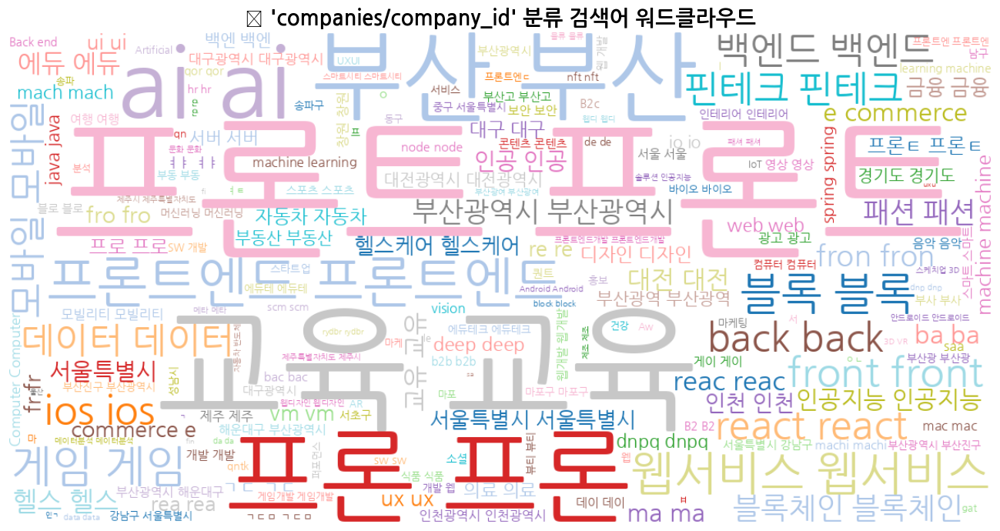


📌 분류: tag — 검색 수: 2484개
상위 10개 검색어:
- IT (45회)
- 콘텐츠 (26회)
- 플랫폼 (24회)
- 마케팅 (22회)
- it (22회)
- AI (21회)
- 모바일 (20회)
- 공연 (16회)
- 디자인 (15회)
- 광고 (15회)


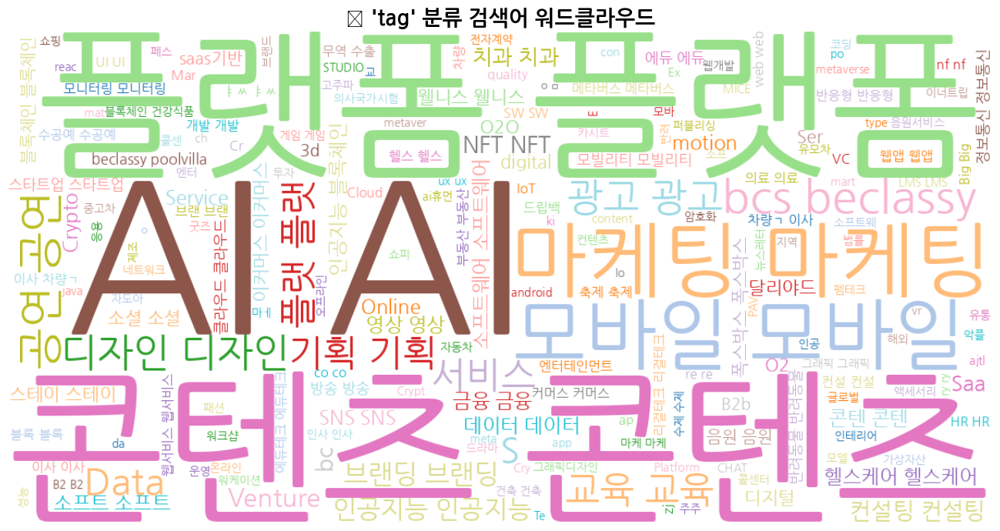


📌 분류: benefits — 검색 수: 1853개
상위 10개 검색어:
- 맥북 (20회)
- 연차 (19회)
- 유연 근무제 (오전 7시 ~ 10시 30분 (18회)
- 도서 (17회)
- AM (13회)
- 맥북 프로 (10회)
- 커피 (9회)
- 석식 (9회)
- 모니터 (9회)
- 야근 (9회)


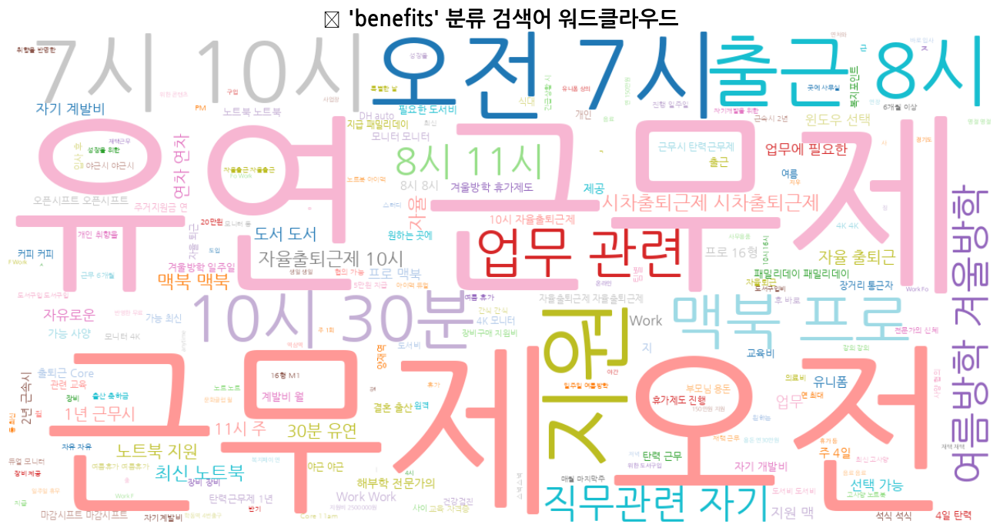

In [ ]:
# 1. 검색 URL만 필터링
search_urls = log_2022_df[log_2022_df['URL'].str.contains('search', na=False)]['URL'].dropna()

# 2. 분류(category)와 검색어(keyword) 추출
def extract_category_and_keyword(url):
    try:
        category_match = re.search(r'search/([^?]+)', url)
        category = category_match.group(1) if category_match else 'unknown'

        keyword_match = re.search(r'(?:name|keywords|q)=([^&]+)', url)
        keyword = unquote_plus(keyword_match.group(1)) if keyword_match else None

        if keyword and len(keyword.strip()) > 1 and keyword.lower() not in ['null', 'none']:
            return category.strip(), keyword.strip()
    except:
        return None
    return None

# 3. 분류별 키워드 수집
category_keywords = defaultdict(list)

for url in search_urls:
    result = extract_category_and_keyword(url)
    if result:
        cat, word = result
        category_keywords[cat].append(word)

# 4. 워드클라우드 함수 정의
def generate_wordcloud_from_counter(counter_obj, title):
    text = ' '.join([word for word, count in counter_obj.items() for _ in range(count)])
    wordcloud = WordCloud(
        width=1200,
        height=600,
        background_color='white',
        colormap='tab20',
        font_path='/usr/share/fonts/truetype/nanum/NanumGothic.ttf'  # 한글 폰트
    ).generate(text)

    plt.figure(figsize=(14, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=20, weight='bold')
    plt.tight_layout()
    plt.show()

# 5. 분류별 상위 10개 + 워드클라우드 출력
for cat, words in category_keywords.items():
    counter = Counter(words)
    print(f"\n📌 분류: {cat} — 검색 수: {len(words)}개")
    print("상위 10개 검색어:")
    for word, count in counter.most_common(10):
        print(f"- {word} ({count}회)")
    generate_wordcloud_from_counter(counter, f"📚 '{cat}' 분류 검색어 워드클라우드")

## 1-2. 분석배경 (유저 및 기업 주요 EDA)

### 유저 수 - 공고 수 Granger Test

In [ ]:
print("📈 Granger Test: user_mau ➝ company_mau")
grangercausalitytests(mau_diff[['company_mau', 'user_mau']], maxlag=3)

print("📈 Granger Test: company_mau ➝ user_mau")
grangercausalitytests(mau_diff[['user_mau', 'company_mau']], maxlag=3)

📈 Granger Test: user_mau ➝ company_mau

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9485  , p=0.3423  , df_denom=19, df_num=1
ssr based chi2 test:   chi2=1.0982  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0717  , p=0.3006  , df=1
parameter F test:         F=0.9485  , p=0.3423  , df_denom=19, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1563  , p=0.8566  , df_denom=16, df_num=2
ssr based chi2 test:   chi2=0.4104  , p=0.8145  , df=2
likelihood ratio test: chi2=0.4064  , p=0.8161  , df=2
parameter F test:         F=0.1563  , p=0.8566  , df_denom=16, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1901  , p=0.9012  , df_denom=13, df_num=3
ssr based chi2 test:   chi2=0.8776  , p=0.8308  , df=3
likelihood ratio test: chi2=0.8589  , p=0.8353  , df=3
parameter F test:         F=0.1901  , p=0.9012  , df_denom=13, df_num=3
📈 Granger Test: company_mau ➝ user_mau

Granger Causality
num

{np.int64(1): ({'ssr_ftest': (np.float64(0.08876400725039202),
    np.float64(0.7689877955343141),
    np.float64(19.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(0.1027793768162434),
    np.float64(0.7485194279446974),
    np.int64(1)),
   'lrtest': (np.float64(0.10254004012233509),
    np.float64(0.7488025196514067),
    np.int64(1)),
   'params_ftest': (np.float64(0.0887640072504076),
    np.float64(0.7689877955342953),
    np.float64(19.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(0.016124277658896288),
    np.float64(0.9840209909022954),
    np.float64(16.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(0.04232622885460276),
    np.float64(0.9790592528548477),
    np.int64(2)),
   'lrtest': (np.float64(0.042283631091493135),
    np.float64(0.9790801059439824),
    np.int64(2)),
   'params_ftest': (np.float64(0.0161242776589201),
    np.float64(0.9840209909022727),
    np.float64(16.0),
    2.0)},
   array([[0., 0., 1., 0., 0.],
   

In [ ]:
# 유저 수 → 공고 수 순서로 구성
df_gc_reversed = supply_demand_df[["users", "postings"]].dropna()
granger_rev = grangercausalitytests(df_gc_reversed, maxlag=3, verbose=False)

# 각 lag에 대한 p-value 정리
p_values_rev = {
    "lag": [],
    "ssr_ftest_p_value": [],
    "ssr_chi2_p_value": [],
    "lrtest_p_value": [],
    "params_ftest_p_value": []
}

for lag, result in granger_rev.items():
    test_results = result[0]
    p_values_rev["lag"].append(lag)
    p_values_rev["ssr_ftest_p_value"].append(test_results["ssr_ftest"][1])
    p_values_rev["ssr_chi2_p_value"].append(test_results["ssr_chi2test"][1])
    p_values_rev["lrtest_p_value"].append(test_results["lrtest"][1])
    p_values_rev["params_ftest_p_value"].append(test_results["params_ftest"][1])

# 표로 정리
results_df_rev = pd.DataFrame(p_values_rev)
results_df_rev

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning:

verbose is deprecated since functions should not print results



,lag,ssr_ftest_p_value,ssr_chi2_p_value,lrtest_p_value,params_ftest_p_value
0,1,0.025278,0.009517,0.015159,0.025278
1,2,0.107320,0.036769,0.055666,0.107320
2,3,0.175579,0.035715,0.066333,0.175579


- 코드인의 주요 수익원은 채용공고, 기업행사 광고, 유저 DM에서 발생하며, 이 모든 항목은 기업의 MAU (Monthly Active Users) 규모에 의해 결정된다.
특히, 기업 MAU는 유저 MAU의 영향을 받는다. 즉, 유저가 많아야 기업도 플랫폼에 확실히 참여하게 된다고 볼 수 있다.

- Granger Causality Test 결과에 따르면 유저 수 감소가 1개월 후의 채용공고 수 감소에 유의미한 영향을 미치는 것으로 나타났고 (p = 0.025), 이는 유저 유입이
플랫폼 활성화의 선행지표로 작용함을 시사한다.

> Granger Causality Test (그랜저 인과관계 검정) 두 시계열 변수 간의 **인과 관계**를 추론하는 통계적 방법론



### 월별 신규 채용공고 수

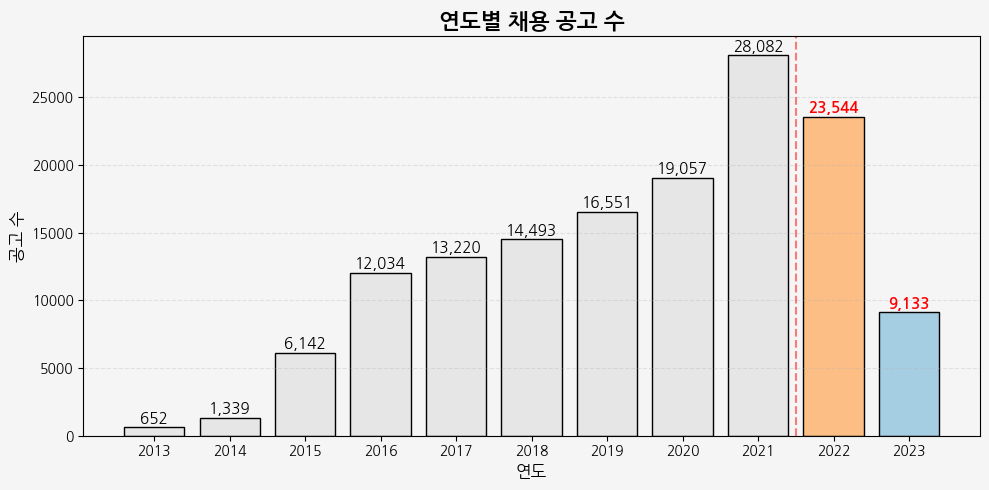

In [ ]:
# 더 연한 회색으로 수정 및 배경색 지정
very_light_gray = '#F5F5F5'  # 그래프 배경용
light_gray_box = '#E6E6E6'   # 박스 색상
highlight_2022 = '#FDBE85'   # 좀 더 진한 파스텔 오렌지
highlight_2023 = '#A6CEE3'   # 파스텔 블루

# 색상 재정의
bar_colors = []
for year in yearly_postings_all['연도']:
    if year == 2022:
        bar_colors.append(highlight_2022)
    elif year == 2023:
        bar_colors.append(highlight_2023)
    else:
        bar_colors.append(light_gray_box)

# 값 표시
for bar, year in zip(bars, yearly_postings_all['연도']):
    yval = bar.get_height()
    if year != 2022:  # 텍스트가 선과 겹치는 것 방지
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 100, f"{yval:,}",
                ha='center', va='bottom', fontsize=11)

# '감소 시작' 라벨 (2022년부터 감소니까 좌측 끝 기준에서 조금 우측으로 선)
if 2022 in yearly_postings_all['연도'].values:
    idx = yearly_postings_all[yearly_postings_all['연도'] == 2022].index[0]
    bar = bars[idx]
    x_center = bar.get_x() + bar.get_width() / 2
    ymax = bar.get_height()
    ax.axvline(x=x_center, linestyle='--', color='red', alpha=0.5)
    ax.text(x_center, ymax + 400, '감소 시작', color='red', fontsize=10,
            ha='center', va='bottom')

# 시각화 실행
fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor(very_light_gray)
ax.set_facecolor(very_light_gray)

bars = ax.bar(x_labels,
              yearly_postings_all['공고 수'],
              color=bar_colors, edgecolor='black')

# x축 라벨
ax.set_xticks(x_labels)
ax.set_xticklabels(bar_positions)

# 값 표시: 전체 연도에 대해, 2022/2023은 빨간색 굵게
for bar, year in zip(bars, yearly_postings_all['연도']):
    yval = bar.get_height()
    if year in [2022, 2023]:
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 100, f"{yval:,}",
                ha='center', va='bottom', fontsize=11, color='red', weight='bold')
    else:
        ax.text(bar.get_x() + bar.get_width() / 2, yval + 100, f"{yval:,}",
                ha='center', va='bottom', fontsize=11)

# 감소 시작선 (2021~2022 사이), 텍스트 제거
ax.axvline(x=x_transition, linestyle='--', color='red', alpha=0.5)

# 스타일
ax.set_title("연도별 채용 공고 수", fontsize=16, weight='bold')
ax.set_xlabel("연도", fontsize=12)
ax.set_ylabel("공고 수", fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

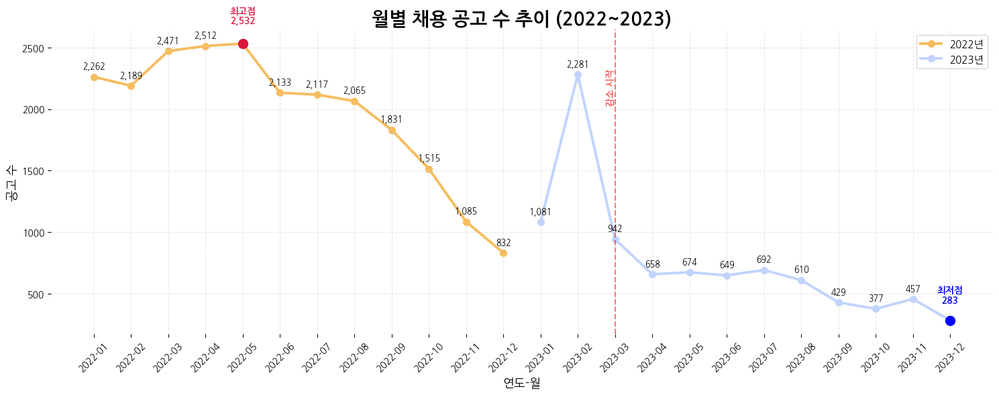

In [ ]:
# cdate 기준으로 연월 파생
job_df['cdate'] = pd.to_datetime(job_df['cdate'], errors='coerce')
job_df['year_month'] = job_df['cdate'].dt.to_period('M').astype(str)

# 2022년 ~ 2023년 사이만 필터링
job_df_filtered = job_df[
    (job_df['cdate'] >= '2022-01-01') & (job_df['cdate'] <= '2023-12-31')
]

# 월별 공고 수 집계
monthly_postings_filtered = (
    job_df_filtered.groupby('year_month')['job_uuid']
    .count()
    .reset_index()
)
monthly_postings_filtered.columns = ['year_month', 'postings']

# 연도별 분할
monthly_postings_filtered['year'] = monthly_postings_filtered['year_month'].str[:4]
data_2022 = monthly_postings_filtered[monthly_postings_filtered['year'] == '2022']
data_2023 = monthly_postings_filtered[monthly_postings_filtered['year'] == '2023']

# 최고/최저 공고수
max_row = monthly_postings_filtered.loc[monthly_postings_filtered['postings'].idxmax()]
min_row = monthly_postings_filtered.loc[monthly_postings_filtered['postings'].idxmin()]

# 시각화

plt.figure(figsize=(15, 6))

# 선 그래프
plt.plot(data_2022['year_month'], data_2022['postings'],
         marker='o', linewidth=2.8, markersize=7, color=colors[1], label='2022년')
plt.plot(data_2023['year_month'], data_2023['postings'],
         marker='o', linewidth=2.8, markersize=7, color=colors[5], label='2023년')

# 최고점
plt.scatter(max_row['year_month'], max_row['postings'], color='crimson', s=100, zorder=5)
plt.text(max_row['year_month'], max_row['postings'] + 150, f"최고점\n{max_row['postings']:,}",
         ha='center', va='bottom', fontsize=10, color='crimson', weight='bold')

# 최저점
plt.scatter(min_row['year_month'], min_row['postings'], color='blue', s=100, zorder=5)
plt.text(min_row['year_month'], min_row['postings'] + 130, f"최저점\n{min_row['postings']:,}",
         ha='center', va='bottom', fontsize=10, color='blue', weight='bold')

# 숫자 라벨 (일부 제외)
for x, y in zip(monthly_postings_filtered['year_month'], monthly_postings_filtered['postings']):
    if x not in ['2022-05', '2023-12']:
        plt.text(x, y + 50, f"{y:,}", ha='center', va='bottom', fontsize=9)

# 감소 시작 표시
plt.axvline(x='2023-03', linestyle='--', color='red', alpha=0.5)
plt.text('2023-03', plt.ylim()[1]*0.88, "감소 시작", rotation=90,
         va='top', ha='right', fontsize=10, color='red')

# 스타일
plt.title("월별 채용 공고 수 추이", fontsize=20, weight='bold')
plt.xlabel("연도-월", fontsize=13)
plt.ylabel("공고 수", fontsize=13)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.3)
plt.box(False)
plt.legend(fontsize=11, loc='upper right')
plt.tight_layout()
plt.show()

- 2022년 1월: 약 2,300건 → 2023년 12월: 300건 이하
- 플랫폼 내 채용 활동이 급감하며 이는 유입 유저에도 부정적인 영향을 미침.

### 월별 신규 기업 및 유저 수

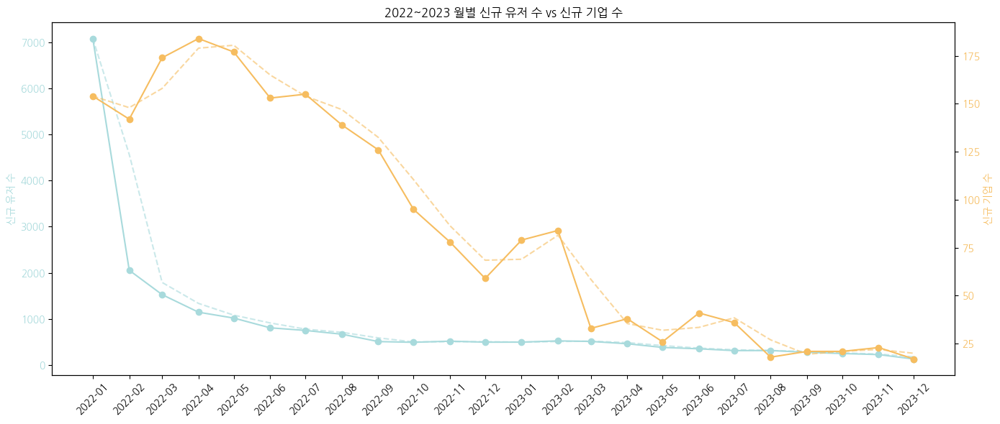

In [ ]:
# datetime 변환
log_df["year_month"] = pd.to_datetime(log_df["year_month"].astype(str))
job_df["year_month"] = pd.to_datetime(job_df["year_month"].astype(str))

# 신규 유저 수 (user_uuid의 최초 등장 시점 기준)
first_seen_user = log_df.groupby("user_uuid")["year_month"].min().reset_index()
new_users = first_seen_user.groupby("year_month")["user_uuid"].count().reset_index(name="new_users")

# 신규 기업 수 (company_uuid의 최초 등장 시점 기준)
first_seen_company = job_df.groupby("company_uuid")["year_month"].min().reset_index()
new_companies = first_seen_company.groupby("year_month")["company_uuid"].count().reset_index(name="new_companies")

# 2022~2023년으로 필터링
new_users_filtered = new_users[
    (new_users["year_month"] >= "2022-01") & (new_users["year_month"] <= "2023-12")
]
new_companies_filtered = new_companies[
    (new_companies["year_month"] >= "2022-01") & (new_companies["year_month"] <= "2023-12")
]

# 색상
color_user = "#A8DADC"
color_company = "#F6BD60"

# 시각화
fig, ax1 = plt.subplots(figsize=(14, 6))

# 신규 유저 수 (좌측 Y축)
ax1.plot(new_users_filtered["year_month"], new_users_filtered["new_users"],
         color=color_user, marker="o", label="신규 유저 수")
ax1.set_ylabel("신규 유저 수", color=color_user)
ax1.tick_params(axis="y", labelcolor=color_user)
ax1.set_xticks(new_users_filtered["year_month"])
ax1.set_xticklabels(new_users_filtered["year_month"].dt.strftime("%Y-%m"), rotation=45)

# 신규 기업 수 (우측 Y축)
ax2 = ax1.twinx()
ax2.plot(new_companies_filtered["year_month"], new_companies_filtered["new_companies"],
         color=color_company, marker="o", label="신규 기업 수")
ax2.set_ylabel("신규 기업 수", color=color_company)
ax2.tick_params(axis="y", labelcolor=color_company)

z_user = pd.Series(new_users_filtered["new_users"]).rolling(2, min_periods=1).mean()
z_company = pd.Series(new_companies_filtered["new_companies"]).rolling(2, min_periods=1).mean()
ax1.plot(new_users_filtered["year_month"], z_user, color=color_user, linestyle="--", alpha=0.6)
ax2.plot(new_companies_filtered["year_month"], z_company, color=color_company, linestyle="--", alpha=0.6)

# 제목 및 정리
plt.title("2022~2023 월별 신규 유저 수 vs 신규 기업 수")
fig.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

### 기업 및 유저 MAU

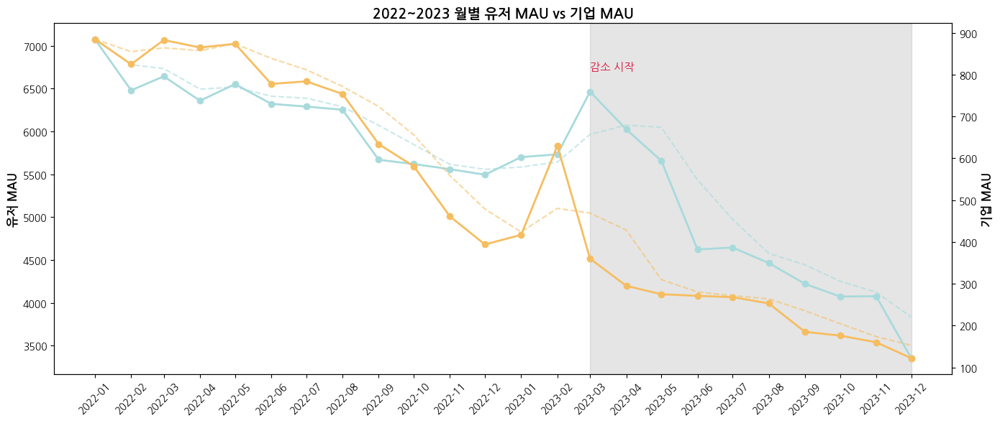

In [ ]:
# 유저  MAU 계산
log_df['timestamp'] = pd.to_datetime(log_df['timestamp'])
log_df['year_month'] = log_df['timestamp'].dt.to_period('M').astype(str)

user_mau = (
    log_df.groupby('year_month')['user_uuid']
    .nunique()
    .reset_index()
    .rename(columns={'user_uuid': 'user_mau'})
)
# 기업 계산: 채용공고를 하나라도 올린 기업
job_df['cdate'] = pd.to_datetime(job_df['cdate'], errors='coerce')
job_df = job_df[(job_df['cdate'] >= '2022-01-01') & (job_df['cdate'] <= '2023-12-31')]
job_df['year_month'] = job_df['cdate'].dt.to_period('M').astype(str)

company_mau = (
    job_df.groupby('year_month')['company_uuid']
    .nunique()
    .reset_index()
    .rename(columns={'company_uuid': 'company_mau'})
)

# user_mau도 동일하게 기간 필터링
user_mau['year_month'] = pd.to_datetime(user_mau['year_month'])
user_mau = user_mau[(user_mau['year_month'] >= '2022-01-01') & (user_mau['year_month'] <= '2023-12-31')]

# company_mau 날짜 형식 통일
company_mau['year_month'] = pd.to_datetime(company_mau['year_month'])

# 색상 설정
color_user = "#A8DADC"     # teal mint
color_company = "#F6BD60"  # light orange

# 시각화
fig, ax1 = plt.subplots(figsize=(14, 6))

# 유저 MAU (좌측 Y축)
ax1.plot(user_mau["year_month"], user_mau["user_mau"],
         color=color_user, marker="o", label="유저 MAU", linewidth=2)
ax1.set_ylabel("유저 MAU", color="black", fontsize=12, fontweight='bold')
ax1.tick_params(axis="y", labelcolor="black")
ax1.set_xticks(user_mau["year_month"])
ax1.set_xticklabels(user_mau["year_month"].dt.strftime("%Y-%m"), rotation=45)

# 기업 MAU (우측 Y축)
ax2 = ax1.twinx()
ax2.plot(company_mau["year_month"], company_mau["company_mau"],
         color=color_company, marker="o", label="기업 MAU", linewidth=2)
ax2.set_ylabel("기업 MAU", color="black", fontsize=12, fontweight='bold')
ax2.tick_params(axis="y", labelcolor="black")

# 추세선 추가 (이동 평균)
z_user = user_mau["user_mau"].rolling(3, min_periods=1).mean()
z_company = company_mau["company_mau"].rolling(3, min_periods=1).mean()
ax1.plot(user_mau["year_month"], z_user, color=color_user, linestyle="--", alpha=0.6)
ax2.plot(company_mau["year_month"], z_company, color=color_company, linestyle="--", alpha=0.6)

# 강조 영역 (행동 감소 시작 구간)
highlight_start = pd.to_datetime("2023-03")
highlight_end = pd.to_datetime("2023-12")
ax1.axvspan(highlight_start, highlight_end, color="gray", alpha=0.2)
ax1.text(pd.to_datetime("2023-03"), max(user_mau["user_mau"]) * 0.95,
         "감소 시작", color="crimson", fontsize=11)

# 제목 및 정리
plt.title("2022~2023 월별 유저 MAU vs 기업 MAU", fontsize=14, fontweight='bold')
fig.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

> 기업 MAU: 월 별로 1회 이상 채용공고를  올린 기록이 있는 고유 기업의 수
<br> 유저 MAU: 월 별로 한번이라도 활동한 고유 유저 수

- 최근 2년간 플랫폼의 주요 지표는 전반적으로 하락하고 있다. 이는 코드인이 채용 플랫폼으로서 양측 사용자 모두의 참여도와 매칭 효율이 저하되고 있음을 의미하며, 구조적인 개선이 필요한 시점임을 시사한다.

# 2_ 퍼널 기반 사용자 여정 분석 및 개선 전략

## 2-1. 전체 퍼널 분석

In [ ]:
# 퍼널 단계 및 값
stages = ['사이트 방문', '공고 열람', '이력서 작성', '지원']
values = [21348, 18141, 16335, 3250]

# 전환률 계산
conversion_labels = [""]
for i in range(1, len(values)):
    prev = values[i - 1]
    curr = values[i]
    rate = (curr / prev) * 100
    if i == len(values) - 1:
        label = f"<b><span style='color:red'>전환률 {rate:.1f}%</span></b>"
    else:
        label = f"<span style='color:green'>전환률 {rate:.1f}%</span>"
    conversion_labels.append(label)

# 사용자 정의 파스텔 색상
colors = [
    "#A8DADC",  # teal mint
    "#F6BD60",  # light orange
    "#FFB5A7",  # pink
    "#B5E48C",  # lime pastel green
]

# 퍼널 차트 그리기
fig = go.Figure()

fig.add_trace(go.Funnel(
    y=stages,
    x=values,
    textposition="inside",
    texttemplate="%{value:,}",
    marker={"color": colors},
    opacity=0.95,
    name="지원 퍼널"
))


# 전환률 주석 추가 (마지막은 빨간색, 굵게)
for i in range(1, len(stages)):
    color = "red" if i == len(stages) - 1 else "green"
    weight = "bold" if i == len(stages) - 1 else "normal"
    offset = -0.05 if i < len(stages) - 1 else 0.05  # ← 그래프 쪽으로 이동시키는 핵심 포인트

    fig.add_annotation(
        x=values[i] * (1 + offset),  # 막대 바로 옆으로 살짝 이동
        y=stages[i],
        text=f"<span style='color:{color}; font-weight:{weight}'>전환률 {values[i]/values[i-1]*100:.1f}%</span>",
        showarrow=False,
        font=dict(size=13),
        align="left"
    )


# 스타일 설정
fig.update_layout(
    title="퍼널 분석 (단계별 전환률)",
    title_font_size=22,
    font=dict(size=14),
    plot_bgcolor="#FBFCFD",
    paper_bgcolor="#FBFCFD",
    margin=dict(t=60, l=60, r=60, b=60),
    height=600
)

fig.show()

- 방문 → 공고 열람 : 전환율 **85.0%**
- 공고 열람 → 이력서 작성 : 전환율 **90.0%**
- 이력서 작성 → 지원 완료 : 전환율 **19.9%**

이탈이 가장 크게 발생하는 지점은 **‘이력서 작성 → 지원 완료’ 단계**로 확인이 되며, 해당 구간을 중심으로 전환율 개선을 위한 인사이트를 도출하고자 한다. 이후 본 보고서는 위 퍼널의 흐름을 따라 각 단계별 유저 행동을 분석하고, 그 과정에서 영향을 미치는 요인들을 다각도로 고찰한다.

## 2-2. 사이트 방문 -> 공고 열람
유저가 플랫폼에 방문한 이후 가장 먼저 수행하는 행동은 **공고 검색**이다.

**검색 필터를 사용하여** 유저는 **원하는 조건의 채용공고를 선별**하여 열람할 수 있다.

### 필터 사용량 비교

#### 월별 필터 사용량 추이

<function matplotlib.pyplot.show(close=None, block=None)>

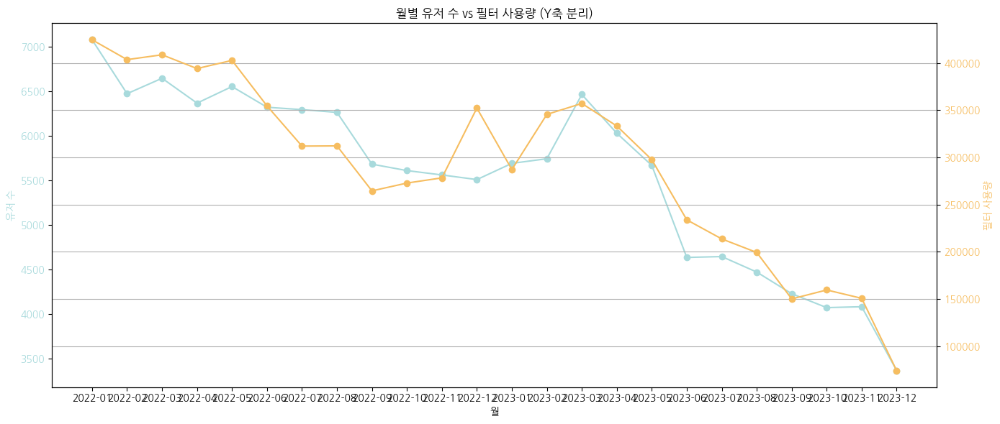

In [ ]:
fig, ax1 = plt.subplots(figsize=(14, 6))

# 첫 번째 Y축: 유저 수
ax1.set_xlabel("월")
ax1.set_ylabel("유저 수", color=colors[0])
ax1.plot(analysis_df["year_month"].astype(str), analysis_df["total_users"],
         color=colors[0], marker='o', label="유저 수")
ax1.tick_params(axis='y', labelcolor=colors[0])

# 두 번째 Y축: 필터 사용량
ax2 = ax1.twinx()
ax2.set_ylabel("필터 사용량", color=colors[1])
ax2.plot(analysis_df["year_month"].astype(str), analysis_df["filter_usage"],
         color=colors[1], marker='o', label="필터 사용량")
ax2.tick_params(axis='y', labelcolor=colors[1])

# 제목 및 레이아웃
plt.title("월별 유저 수 vs 필터 사용량 (Y축 분리)")
fig.tight_layout()
plt.grid(True)
plt.show

#### 파라미터 별 사용량 변화

In [ ]:
# 월별 파라미터 사용량 추출 함수
def get_monthly_param_counts(df):
    monthly_counts = {}
    for ym in sorted(df['year_month'].unique()):
        urls = df[df['year_month'] == ym]['URL']
        param_counter = defaultdict(int)
        for url in urls:
            try:
                query = url.split('?')[1] if '?' in url else ''
                params = parse_qs(query)
                for p in params:
                    param_counter[p] += 1
            except:
                continue
        monthly_counts[ym] = dict(param_counter)
    return pd.DataFrame(monthly_counts).T.fillna(0).astype(int)

|필터 |파라미터	|의미	|2022 사용량	|2023 사용량	|변화	|변화율
|-|-|-|-|-|-|-|
|job	|업무 분야	|288,707	|357,004	|⬆️ +68,297	|+23.66%
|career_type	|경력 수준	|216,133	|119,488	|⬇️ -96,645	|-44.72%
|location	|지역	|100,999	|60,107	|⬇️ -40,892	|-40.49%
|specialty	|활동 분야	|99,139	|58,968	|⬇️ -40,171	|-40.52%
|remote	|원격 근무	|27,361	|21,990	|⬇️ -5,371	|-19.63%

- 업무 중식 탐색(`job`) 사용량만 유일하게 증가, **나머지 주요 필터는 모두 사용 감소**
- 특히 **경력 필터는 절반 이상 감소**, 지역·활동 분야 필터도 40% 이상 감소
- 이는 유저가 원하는 공고를 세부 조건으로 좁혀보는 탐색 과정이 약화되고 있음을 시사함

즉, 플랫폼 진입 이후 ‘공고 탐색’단계에서

유저가 원하는 조건으로 **자신에게 맞는 공고를 찾기 어려워지고 있을 가능성**이 있다.

### 채용공고 별 지원자 수 회귀분석

In [ ]:
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

# 독립 변수와 종속 변수 설정
"""
1. p-value 유의수준 많이 넘는(p > 0.3) 'field_마케팅', 'field_운영' 제거
2. StandardScaler 사용
3. 회귀계수 낮은 'location_score' 제거
"""
X = regression_df[['allow_remote', 'can_show_salary', '경력', '인턴',
       'field_SW 개발', 'field_디자인', 'period', 'bookmark_cnt',
        'employee_count_encoded', 'can_show_round', 'can_show_raised']]
y = regression_df['application_cnt']

# 변수 표준화
X_scaled = StandardScaler().fit_transform(X)  # X는 설명변수

# 상수항 추가
X_scaled = sm.add_constant(X)

# 모델 적합
model = sm.OLS(y, X_scaled).fit()

# 결과 출력
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        application_cnt   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     5930.
Date:                Wed, 14 May 2025   Prob (F-statistic):               0.00
Time:                        01:29:39   Log-Likelihood:            -1.1267e+05
No. Observations:               37331   AIC:                         2.254e+05
Df Residuals:                   37319   BIC:                         2.255e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

✅ 핵심 개선 포인트 요약

| 항목            | 이전 결과                                      | 현재 결과               | 설명                 |
| ------------- | ------------------------------------------ | ------------------- | ------------------ |
| **VIF 경고**    | 조건수 $Cond. No.$ ≈ 1480                     | **Cond. No. = 680** | 다중공선성 경고 완화됨       |
| **모델 간결성**    | 변수 16개                                     | **변수 11개**          | 해석력 및 모델 단순화 향상    |
| **불필요 변수 제거** | `field_운영`, `마케팅`, `view_count_log1p` 등 제거 | p-value 기준으로 잘 제거됨  |                    |
| **스케일 조정**    | 안됨                                         | **표준화 완료**          | 계수 해석 용이성 증가       |
| **R² 유지**     | 약 0.636–0.637                              | **0.636**           | 성능 저하 없이 모델 최적화 성공 |

<br>

📌 주요 계수 해석 (스케일 표준화된 상태 기준)
- bookmark_cnt: 표준화 후에도 여전히 압도적인 영향력 (t=230). 지원 수에 가장 직접적인 영향.

- field_SW 개발: +1.664 → SW 개발 직무는 타 직무 대비 지원이 매우 많음.

- 인턴: -0.813 → 인턴인 경우 지원 수가 감소.

- 경력: +0.334 → 경력이 있는 공고일수록 지원 수가 증가.

- can_show_salary: -0.142 → 연봉 공개 시 지원 수가 줄어드는 경향, 흥미로운 포인트.

- can_show_round: -0.305 → 투자 라운드 공개가 오히려 지원 수를 낮춤.

- employee_count_encoded: -0.062 → 규모가 커질수록 지원이 약간 줄어드는 경향.

<br>

🔍 개선 가능성
- allow_remote와 can_show_raised는 유의수준 0.05 이상 (p=0.07, 0.11) → 해석 목적이라면 보존 가능, 예측만 목표라면 제거 고려.

- can_show_raised는 기업의 자금력 신호인데 지원에 영향 없다는 점이 의외 → 도메인적으로 설명 필요.

- Standard Scaler로 독립변수 표준화 이후 회귀분석 하여 회귀계수간 크기 비교 가능.
- 지원자 수에 영향력이 높은 필터: 같은 역할끼리 묶어서 계수 절댓값 합으로 순위 정렬.
    - [1위] 업무 분야: `field_SW 개발` 1.489 + `field_디자인` 0.3861 **= 1.8751**
    - [2위] 경력 수준: `경력` 0.3342 + `인턴` 0.8126 = 1.1504
    - [3위] 정렬 순서: `bookmark_cnt` 0.8037

### 지역 검색어 워드 클라우드

<ipython-input-187-18dba0717bcb>:54: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) NanumGothic.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) NanumGothic.



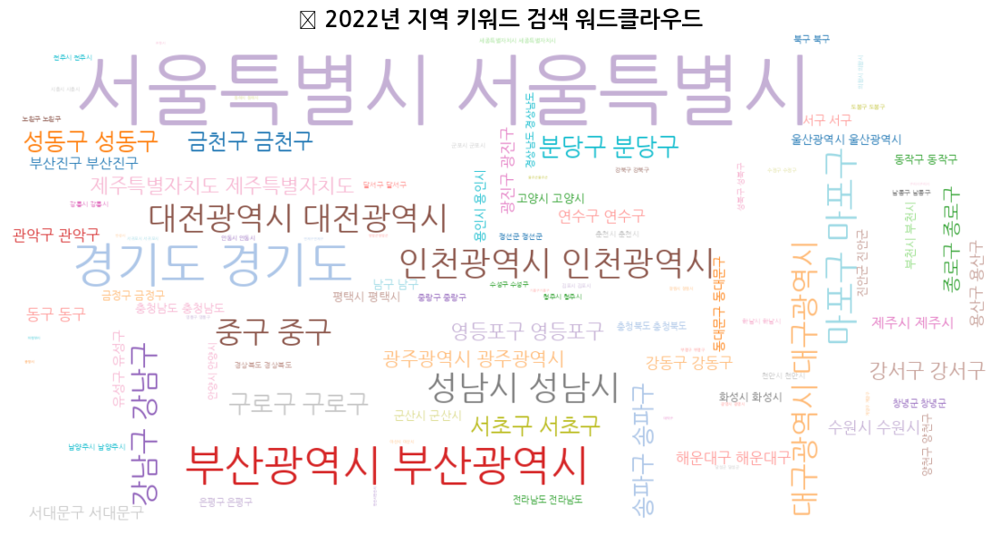

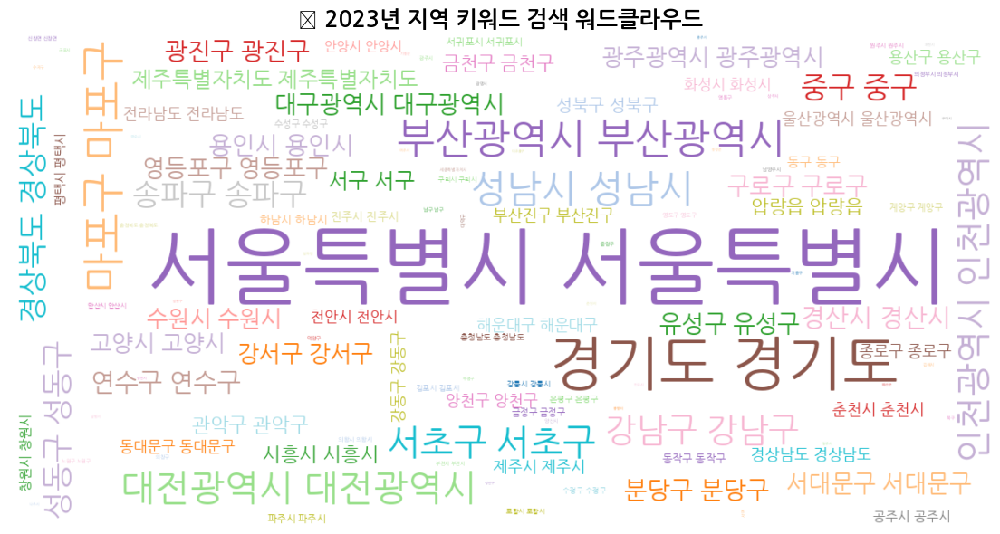

In [ ]:
# 1. 법정동명 분리
df_regions[['시도', '시군구', '읍면동']] = df_regions['법정동명'].str.split(" ", expand=True, n=2)

# 2. 현행 지역만 필터
df_regions = df_regions[df_regions['폐지여부'] == "존재"]

# 3. 지역명 세트 구성 (중복 제거)
valid_regions_set = set(df_regions['시도'].dropna()) | \
                    set(df_regions['시군구'].dropna()) | \
                    set(df_regions['읍면동'].dropna())

# 4. 검색 로그에서 지역 키워드 추출

def extract_valid_region_keywords(url_series, valid_regions):
    keyword_counter = Counter()
    for url in url_series.dropna():
        try:
            match = re.search(r'(?:name|keywords|q)=([^&]+)', url)
            if match:
                keyword = unquote_plus(match.group(1)).strip()
                words = re.findall(r'[가-힣]{2,10}', keyword)
                for word in words:
                    if word in valid_regions:
                        keyword_counter[word] += 1
        except:
            continue
    return keyword_counter

# 5. 2022/2023 로그에서 'search' URL만 추출
search_urls_2022 = log_2022_df[log_2022_df['URL'].str.contains('search', na=False)]['URL']
search_urls_2023 = log_2023_df[log_2023_df['URL'].str.contains('search', na=False)]['URL']

region_counts_2022 = extract_valid_region_keywords(search_urls_2022, valid_regions_set)
region_counts_2023 = extract_valid_region_keywords(search_urls_2023, valid_regions_set)

# 6. 워드클라우드 시각화

def plot_wordcloud_from_counter(counter, title):
    text = ' '.join([k for k, v in counter.items() for _ in range(v)])
    wordcloud = WordCloud(
        font_path='/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
        width=1200, height=600, background_color='white', colormap='tab20'
    ).generate(text)

    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=18, weight='bold')
    plt.tight_layout()
    plt.show()

# 출력
plot_wordcloud_from_counter(region_counts_2022, "📍 2022년 지역 키워드 검색 워드클라우드")
plot_wordcloud_from_counter(region_counts_2023, "📍 2023년 지역 키워드 검색 워드클라우드")

📊 전체 검색 로그 기준 지역 키워드 TOP 20
 지역 키워드  검색 수 검색 비중(%)
  서울특별시 3,677    28.60
    경기도 1,082     8.42
  부산광역시   655     5.10
    마포구   490     3.81
    성남시   430     3.35
  인천광역시   412     3.20
  대전광역시   398     3.10
    강남구   315     2.45
     중구   300     2.33
  대구광역시   264     2.05
    서초구   253     1.97
    성동구   228     1.77
    송파구   226     1.76
    분당구   203     1.58
    구로구   196     1.52
   영등포구   147     1.14
    금천구   144     1.12
    강서구   140     1.09
  광주광역시   133     1.03
제주특별자치도   132     1.03


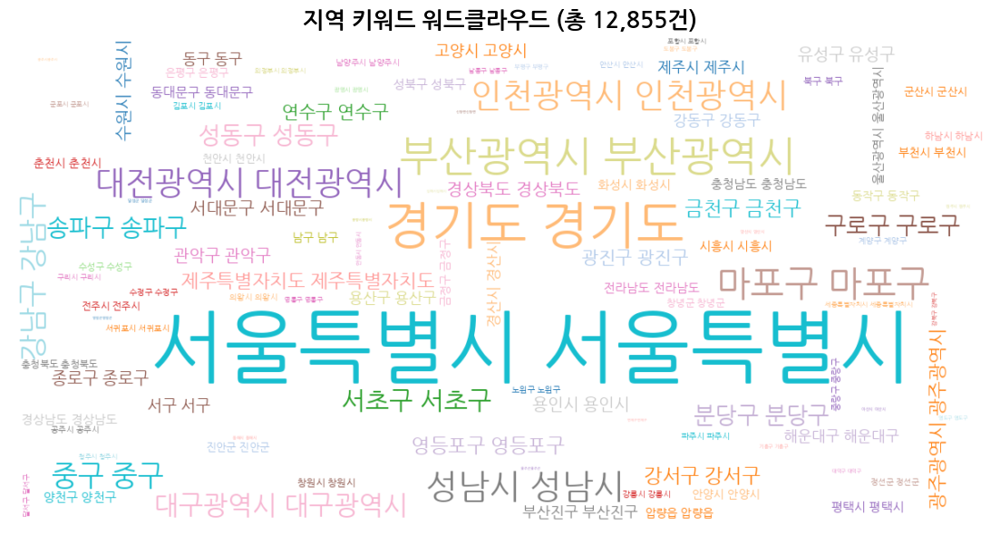

In [ ]:
# 1. 상위 지역 키워드 DataFrame 생성 및 출력

region_df = pd.DataFrame(region_counts_all.most_common(20), columns=["지역 키워드", "검색 수"])
total_search_count = sum(region_counts_all.values())
region_df["검색 비중(%)"] = region_df["검색 수"] / total_search_count * 100

# 표 보기 좋게 출력
print("📊 전체 검색 로그 기준 지역 키워드 TOP 20")
print(region_df.to_string(index=False, formatters={
    '검색 수': '{:,}'.format,
    '검색 비중(%)': '{:.2f}'.format
}))

# 2. 워드클라우드 시각화
plot_wordcloud_from_counter(region_counts_all, f"지역 키워드 워드클라우드 (총 {total_search_count:,}건)")

### 개선 제안

1. 업무 분야 + 활동 분야 통합
    
    → `대분류(직군)` → `중분류(기술/역할)` 흐름으로 **드릴다운 방식 구성**
    
2. 경력 필터
    
    → 기존 `신입 / 경력 / 인턴` → `인턴 / 0~1년 / 2~4년 / 5~8년 / 9년 이상` 등
    
    → 사용자 입장에서 보다 **정확하게 본인의 상황에 맞는 검색이 가능**
    
    경쟁사 플렛폼의 세분화된 경력 타깃 콘텐츠 구성 참고

    > 원티드: 0-1년차 / 2-4년차 / 5-8년차
    
3. 지역 필터 구조 개선
    
    → `광역시·도` → `시/군/구` → `동/읍/면` 으로 **계층형 선택 구조 구성**
    
    → 대표 지역 4개만 제시하는 방식은 **선택 범위를 지나치게 제한**
    
    실제 검색된 지역 키워드 약 12,855건을 시각화
    
    서울/경기/부산 등 **광역단위뿐 아니라 '서초구', '서대문구’, ’분당구', '마포구', '연수구' 등 구체적인 시·군·구 단위 지역명 검색 수요가 뚜렷하게 나타남**
    
    → 따라서 현행 지역 필터 구조는 유저의 실제 검색 행동을 충족시키지 못하며, **더 세분화된 지역 탐색 구조 제공이 필요함**
    
4. 정렬 노출 순서 개선
→ 기존안 `최신순 / 인기순 / 연봉순`
→ 개선안 `인기순 / 최신순 / 연봉순`

## 2-3. 공고 열람 -> 이력서 작성

유저는 관심 있는 공고를 열람한 후, 지원을 고려하여 이력서를 작성한다.

공고의 상세 내용을 바탕으로 요구 역량과 조건을 맞추기 위해 유저가 이력서를 보완하는 행동이 관찰된다.



### 기업 세그멘테이션

기업의 플랫폼 활동량 및 인기도 지표를 기반으로 기업을 그룹화(세그멘테이션) 하고, 채용 활동이 활발한 인기 기업에는 ⭐Top50 , Top100 태그를 부여한다. 이를 통해 유저는 신뢰할 수 있는 기업을 빠르게 식별해 지원율이 높아지고, 높은 유저 반응은 기업의 지속적인 활동을 유도한다. 결과적으로 플랫폼의 활성도와 전환률이 함께 상승하며, 유저-기업-플랫폼 간 긍정적인 선순환 구조가 형성될 것으로 기대된다.


| **지표 (Metric)**      | **의미 (Description)**                                                    |
| -------------------- | ----------------------------------------------------------------------- |
| `recency`            | 특정 날로부터 가장 최근 채용공고 게시한 날과의 차이 (날짜 차이, 일 단위)                             |
| `applied_post_rate`  | 공고 지원율 = 지원이 일어난 공고 수 / 전체 공고 수 = `applied_post_count / job_post_count` |
| `bookmark_count`     | 북마크 수 (해당 기업의 공고를 북마크한 수)                                               |
| `follow_count`       | 기업 팔로우 수 (해당 기업을 팔로우한 사용자 수)                                            |
| `reference_count`    | 기업 추천 수 (사용자들이 해당 기업을 추천한 횟수)                                           |
| `view_count`         | 기업 조회 수 (기업 페이지 조회 수)                                                   |
| `total_applications` | 전체 지원 수 (해당 기업의 전체 지원 횟수)                                               |


In [ ]:
# 공고별 북마크 수
bookmark_count_per_job = job_bookmark_df.groupby("job_uuid")["cdate_bookmark"].count().reset_index(name="bookmark_count_per_job")
job_df = job_df.merge(bookmark_count_per_job, how="left", on="job_uuid").fillna(0)
bookmark_count = job_df.groupby("company_uuid")["bookmark_count_per_job"].sum().reset_index(name="bookmark_count")
bookmark_count.head(2)

,company_uuid,bookmark_count
0,00027545-e75b-4b62-9d97-02eaa67618e7,0.0
1,00093c2d-5734-4162-82e8-1def2a831408,0.0


In [ ]:
# 회사별 전체 공고 수
job_post_count = job_df[["job_uuid", "company_uuid"]].groupby("company_uuid")["job_uuid"].count().reset_index(name="job_post_count")
job_post_count.head(2)

,company_uuid,job_post_count
0,00027545-e75b-4b62-9d97-02eaa67618e7,3
1,00093c2d-5734-4162-82e8-1def2a831408,1


In [ ]:
# 회사별 지원된 공고 수
applied_post_count = application_df.groupby(["company_uuid"])["job_uuid"].nunique().reset_index(name="applied_post_count")
applied_post_count.head(2)

,company_uuid,applied_post_count
0,00027545-e75b-4b62-9d97-02eaa67618e7,3
1,0009c5b4-eca5-482a-a9a0-3d08e106909d,11


In [ ]:
# 회사별 지원공고 비율
post_df = job_post_count.merge(applied_post_count, on="company_uuid", how="left").fillna(0)
post_df["applied_post_rate"] = post_df["applied_post_count"] / post_df["job_post_count"]
post_df.head(2)

,company_uuid,job_post_count,applied_post_count,applied_post_rate
0,00027545-e75b-4b62-9d97-02eaa67618e7,3,3.0,1.0
1,00093c2d-5734-4162-82e8-1def2a831408,1,0.0,0.0


In [ ]:
# 회사별 전체 지원 수
total_applications = application_df.groupby("company_uuid")["application_uuid"].count().reset_index(name="total_applications")
total_applications.head(2)

,company_uuid,total_applications
0,00027545-e75b-4b62-9d97-02eaa67618e7,6
1,0009c5b4-eca5-482a-a9a0-3d08e106909d,31


In [ ]:
# 최근 채용공고 업데이트 일자
last_job_post_update = job_df.groupby("company_uuid")["cdate_job"].max().reset_index(name="last_job_post_update")
last_job_post_update.head(2)

,company_uuid,last_job_post_update
0,00027545-e75b-4b62-9d97-02eaa67618e7,2022-06-07 04:24:50+00:00
1,00093c2d-5734-4162-82e8-1def2a831408,2022-06-16 08:27:43+00:00


In [ ]:
dfs = [company_df, post_df, bookmark_count, total_applications, last_job_post_update]
merged_df = reduce(lambda left, right: left.merge(right, on="company_uuid", how="left"), dfs)
merged_df.fillna({
    "job_post_count": 0,
    "total_applications": 0,
    "bookmark_count": 0,
    "applied_post_rate": 0,
    "last_job_post_update": pd.NaT
}, inplace=True)

### 세그멘테이션 방법

- 7개 지표를 기준으로 기업을 3등으로 구간화
- 공고 지원율에만 가중치를 1.1배, 나머지 모든 지표에 동일하게 1배 적용
    - 공고 지원율은 실제 유저의 ‘지원’이라는 **행동 기반 신호**로, 단순한 관심 지표(조회수, 북마크 등)보다 더 강한 선호를 나타낸다는 점에서 상대적으로 높은 가중치를 부여
- 최종 합산 점수를 기준으로 Top50/Top100/일반 기업으로 세그멘테이션

In [ ]:
# 채용공고를 한번이라도 게시한 회사만 추림
active_company_df = merged_df[merged_df["job_post_count"]>0]

reference_date = active_company_df['last_job_post_update'].max()
active_company_df['recency'] = (reference_date - active_company_df['last_job_post_update']).dt.days

# 등급 나누기
num_grades = 3
grade_labels = list(range(1, num_grades+1))

def safe_qcut(series, q, labels):
    try:
        bins = pd.qcut(series, q=q, duplicates='drop')
        if bins.cat.categories.size != len(labels):
            bins = pd.qcut(series, q=q+1, labels=labels, duplicates='drop')
        else:
            bins = pd.qcut(series, q=q, labels=labels)
        return bins.astype(float)
    except Exception as e:
        return pd.Series([np.nan] * len(series), index=series.index)

active_company_df["recency_score"] = safe_qcut(active_company_df["recency"], num_grades, grade_labels[::-1])
active_company_df["applied_post_rate_score"] = safe_qcut(active_company_df["applied_post_rate"], num_grades, grade_labels)
active_company_df["bookmark_count_score"] = safe_qcut(active_company_df["bookmark_count"], num_grades, grade_labels)
active_company_df["follow_count_score"] = safe_qcut(active_company_df["follow_count"], num_grades, grade_labels)
active_company_df["reference_count_score"] = safe_qcut(active_company_df["reference_count"], num_grades, grade_labels)
active_company_df["view_count_score"] = safe_qcut(active_company_df["view_count"], num_grades, grade_labels)
active_company_df["total_applications_score"] = safe_qcut(active_company_df["total_applications"], num_grades, grade_labels)

# 공고 지원율에만 가중치 1.1배, 나머지 동일
active_company_df["tot_score"] = (
    active_company_df["recency_score"]
    + active_company_df["applied_post_rate_score"] * 1.1
    + active_company_df["bookmark_count_score"]
    + active_company_df["follow_count_score"]
    + active_company_df["reference_count_score"]
    + active_company_df["view_count_score"]
    + active_company_df["total_applications_score"]
)

*팔레토 법칙에 기반하면, 활동 기업 중 상위 20%가 전체 공고의 80%를 차지하는 경향이 있다. 하지만 본 분석에서는 Top50/Top100 기업을 다음과 같은 이유로 별도 그룹으로 분류하였다.

*팔레토 법칙: 약 80%가 전체 원인의 20%에서 발생한다는 법칙 즉, 적은 비율의 원인이 전체적인 결과에 큰 영향을 미친다는 뜻

- **운영 효율성**: 숫자상 인지적으로 명확하여 실무 적용 용이함
- **집중 전략:** 상위 기업에 공고 수가 극단적으로 집중되어 있음
- **브랜딩 효과:** `Top 50` , `Top100` 타이틀은 유저에게 높은 신뢰도를 유발하며, 클릭률 상승 효과를 줄 수 있음

이러한 기준에 따라 기업을 세 그룹으로 나누고, 각 그룹에 차별화된 혜택을 부여한다

| 태그     | 기업 랭킹 기준      | 추가 부여 조건              | 주요 혜택                                   |
| ------ | ------------- | --------------------- | --------------------------------------- |
| ⭐Top50 | 상위 1위\~50위    | 공고 7건 이상, 최근 1주 내 로그인 | 배지(⭐) 부여, 추천기업 영역 노출, 무료 광고 혜택 등        |
| Top100 | 51위\~100위     | 공고 3건 이상, 최근 2주 내 활동  | 간소 리포트 제공, 태그 노출                        |
| 일반     | 101위 이하 전체 기업 | 조건 없음                 | 활동 유도 메시지 발송 (예: “1건 더 올리면 Top100 진입!”) |

특히 Top50 그룹은 UI 상에서 별도 배지로 강조되며, 추천 공고 영역에 우선 배치되어 유저의 주목도를 높인다. → 이는 브랜드 신뢰도 상승과 지원률 증가로 이어지는 효과를 기대할 수 있다.

In [ ]:
active_company_df['rank'] = active_company_df['tot_score'].rank(method='first', ascending=False).astype(int)

def assign_grade(rank):
    if rank <= 50:
        return 'Top50'
    elif rank <= 100:
        return 'Top100'
    else:
        return '일반'

active_company_df['group'] = active_company_df['rank'].apply(assign_grade)

In [ ]:
inactive_company_df = merged_df[merged_df["job_post_count"]<=0]
inactive_company_df["group"] = "일반"
total_df = pd.concat([active_company_df, inactive_company_df])
total_df['group'].value_counts()

,count
group,
일반,41559
Top100,50
Top50,50


In [ ]:
groupby_segment = total_df.groupby('group').mean(numeric_only=True).reset_index()
group_order = ["Top50", "Top100", "일반"]
groupby_segment["group"] = pd.Categorical(groupby_segment["group"], categories=group_order, ordered=True)
groupby_segment = groupby_segment.sort_values(by="group").reset_index()
groupby_segment[["group", "job_post_count", "recency","applied_post_rate","bookmark_count","follow_count","reference_count","view_count","total_applications","tot_score","rank"]]

,group,job_post_count,recency,applied_post_rate,bookmark_count,follow_count,reference_count,view_count,total_applications,tot_score,rank
0,Top50,9.240000,189.700000,1.524712,24.020000,443.860000,20.920000,25581.700000,154.900000,21.300000,25.5
1,Top100,9.100000,313.260000,1.615441,12.860000,313.240000,13.880000,12180.500000,106.800000,20.290000,75.5
2,일반,0.752617,421.016735,0.067361,0.427152,9.282851,0.701364,1620.341154,1.847205,13.024163,2281.5


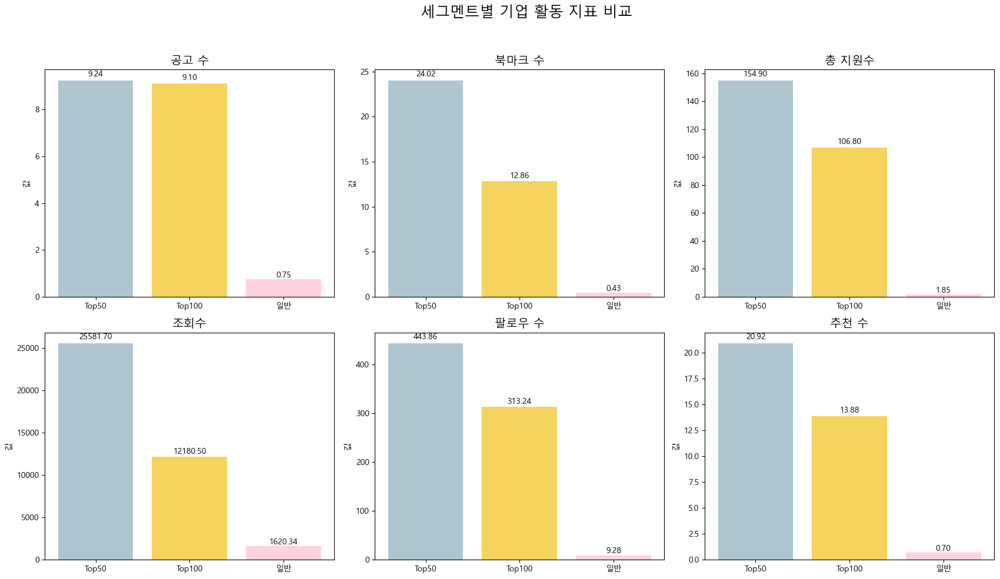

In [ ]:
# @title 세그멘트별 기업 활동 지표 비교
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('세그멘트별 기업 활동 지표 비교', fontsize=18)

metrics = {
    'job_post_count': '공고 수',
    'bookmark_count': '북마크 수',
    'total_applications': '총 지원수',
    'view_count': '조회수',
    'follow_count': '팔로우 수',
    'reference_count': '추천 수'
}
colors = ["#AEC6CF", "#F4D35E", "#FFD1DC"]

for ax, (metric, title) in zip(axes.flatten(), metrics.items()):
    ax.bar(groupby_segment['group'], groupby_segment[metric], color=colors)
    ax.set_title(title, fontsize=14)
    ax.set_ylabel('값')
    ax.set_xlabel('')

    for i, val in enumerate(groupby_segment[metric]):
        ax.text(i, val * 1.01, f'{val:.2f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

- 전반적으로 Top50 > Top100 > 일반 기업 순으로 모든 지표에서 뚜렷한 차등이 나타났다.
- 특히 Top50 기업은 일반 기업 대비 모든 지표에서 압도적으로 높은 수치를 보이며, 이는 플랫폼 내 유저의 선호가 상위 소수 기업에 강하게 집중되어 있음을 보여준다.
    - **공고 수:** 일반 대비 **약 12.28배**
    - **총 지원수:** 일반 대비 **약 84배**
    - **북마크 수** : 일반 대비 **약 56배**


### As-Is vs. To-Be

| 구분           | 현재 구조 (As-Is)       | 개선 구조 (To-Be)                                   |
| ------------ | ------------------- | ----------------------------------------------- |
| **기업 구분**    | 없음                  | 활동량 및 인기도 기반으로 태그 부여, 인기 기업 강조                  |
| **UI/UX**    | 모든 기업 동일 UI, 동일 메시지 | 태그 및 배지(Top50만) 노출, 인기 기업에 맞춤 메시지 및 전용 혜택 영역 제공 |
| **활동 유도 방식** | 일괄 리마인드 메시지         | 등급 상승을 위한 가이드 메시지 및 동기 부여 방식 도입                 |
| **인사이트 제공**  | 제공 정보 제한적           | 인기                                              |


### 태그 도입으로 인한 예상 시나리오

1. 유저 측면
    - 신뢰도 높은 기업을 빠르게 식별 가능 → 유저는 시간을 절약하고 더 믿을 수 있는 공고에 집중 가능
    - Top50/Top100 기업의 공고당 지원 수는 일반 기업 대비 2.5배 이상 → 가시성 증가 시 자연스럽게 유저의 지원율 증가 기대
    - 기업에 대한 유저 반응 (북마크, 팔로우, 추천, 조회, 지원 수)을 기반으로 채용에 활발한 **`인기있는 기업`**이라는 사회적 증거 제공

    → 기업 탐색 효율 개선 + 탐색 피로도 감소 + 지원율 증가

1. 기업 측면
    - 브랜드 이미지 제고 → 유저 관심 유도
    - 재방문 및 공고 재게시 유도
    - 유저 반응 데이터 기반 피드백으로 유지율 및 추가 등록률 상승 기대

    → 공고 등록 유도 + 채용 활동 지속성 확보

1. 플랫폼 측면
    - 유저와 기업 간 매칭률 향상
    - 기업의 리텐션 증가 → 전체 MAU 개선 기대
    - 유저 만족도 향상 → 재방문 및 체류시간 증가 기대

    → 리텐션 기반 MAU 및 전환율 개선 가능

## 2-3. 이력서 작성 -> 지원하기
이력서를 준비한 유저는 최종적으로 공고에 지원하는 행동을 수행한다.

유저가 공고에 대한 관심을 **행동**으로 전환하는 핵심 포인트이며, 플랫폼 입장에서는 실질적인 **지원율 상승**을 목표로 삼는다.

### 이력서 작성 단계별 퍼널 분석

In [ ]:
# 단계별 수치 정리
funnel_counts = {
    '지원단계 step1': len(step1),
    '지원단계 step2': len(step2),
    '지원단계 step3': len(step3),
    '지원단계 step4': len(step4),
    '지원 완료': len(step5)
}

funnel_df = pd.DataFrame({
    '단계': list(funnel_counts.keys()),
    '사용자 수': list(funnel_counts.values())
})

fig = go.Figure(go.Funnel(
    y = funnel_df['단계'],
    x = funnel_df['사용자 수'],
    textinfo = "value+percent initial",
    texttemplate = "%{value:,}<br>(%{percentInitial})", # 사용자 수에 콤마 추가
    marker = dict(color = px.colors.qualitative.Pastel[:len(funnel_df)]), # 파스텔톤 색상 적용
    connector = dict(line = dict(color = "gray", dash = "dot")) # 단계 연결선 추가
))

fig.update_layout(title='이력서 작성 단계별 퍼널 분석')

# 전환율 계산 및 표시
for i in range(len(funnel_df) - 1):
    # 원래 순서에 맞게 인덱스 조정
    current_index = i + 1
    previous_index = i

    conversion_rate = round(funnel_df['사용자 수'].iloc[current_index] / funnel_df['사용자 수'].iloc[previous_index] * 100, 2)

    # 주석 텍스트 내용 및 스타일 설정
    annotation_text = f'전환율 {conversion_rate}%'
    text_color = 'blue'

    if i == len(funnel_df) - 2:
        text_color = 'red'
        annotation_text = f'<b>전환율 {conversion_rate}%</b>'

    fig.add_annotation(
        x=funnel_df['사용자 수'].iloc[current_index] + (funnel_df['사용자 수'].iloc[previous_index] - funnel_df['사용자 수'].iloc[current_index]) / 2,
        y=funnel_df['단계'].iloc[current_index],
        text=annotation_text,
        showarrow=False,
        font=dict(color=text_color)
    )

fig.show()

앞서 퍼널 전체 흐름에서 확인했듯, **`이력서 작성 -> 지원 완료`** 구간의 전환율은 **19.9%**로 급감하며, 전체 이탈의 **약 80%**가 해당 단계에서 발생하는 것으로 나타났다.

이에 따라, 이탈이 집중된 이력서 작성 구간을 보다 면밀히 살펴보기 위해, 이력서 작성 과정 내 **세부 단계(Step 1~4)**를 기준으로 전환율을 재분석하였다.
- 이력서 작성 단계 중 지원 단계 step4에서 주요한 전환율 감소(35.45%)가 관측됨

### step 4 이탈 전 유저의 마지막 행동 분포

<ipython-input-57-982ed9c71451>:28: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-57-982ed9c71451>:28: UserWarning:


The palette list has fewer values (10) than needed (21) and will cycle, which may produce an uninterpretable plot.



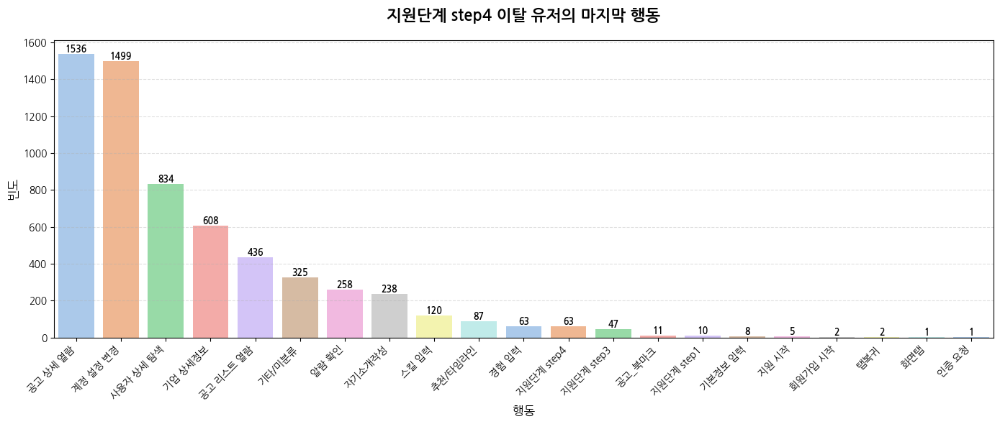

In [ ]:
# 데이터셋 준비
data = {
    '행동': [
        '공고 상세 열람', '계정 설정 변경', '사용자 상세 탐색', '기업 상세정보', '공고 리스트 열람',
        '기타/미분류', '알람 확인', '자기소개작성', '스킬 입력', '추천/타임라인', '경험 입력',
        '지원단계 step4', '지원단계 step3', '공고_북마크', '지원단계 step1', '기본정보 입력',
        '지원 시작', '회원가입 시작', '탭복귀', '화면탭', '인증 요청'
    ],
    '빈도': [
        1536, 1499, 834, 608, 436,
        325, 258, 238, 120, 87, 63,
        63, 47, 11, 10, 8,
        5, 2, 2, 1, 1
    ]
}
df = pd.DataFrame(data)

# 시각화 색상 팔레트
palette = sns.color_palette("pastel")

# 시각화
plt.figure(figsize=(14, 6))
bars = sns.barplot(data=df, x='행동', y='빈도', palette=palette)

# 수치 라벨
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(f'{int(height)}', (bar.get_x() + bar.get_width() / 2, height),
                  ha='center', va='bottom', fontsize=9, fontweight='bold')

# 그래프 꾸미기
plt.title("지원단계 step4 이탈 유저의 마지막 행동", fontsize=16, weight='bold', pad=20)
plt.ylabel("빈도", fontsize=12)
plt.xlabel("행동", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

- 마지막 행동 로그를 봤을 때 공고 상세 열람, 계정 설정 변경 (이력서, 개인 정보 열람)이 이탈 전 주요 행동으로 보임.
- 이는 채용 공고에 지원하려던 유저 자신이 기입한 정보가 정확한지(계정 설정 변경), 자신이 지원하려던 회사가 맞는지, 정보가 일치하는지(공고 상세 열람)에 대해서 재확인 하려다 지원 단계가 초기화되어 이탈하는 현상으로 추측됨 따라서 그에 맞는 A/B 테스트 제안.

### 최근 3달 이력서 작성 단계별 퍼널 분석

In [ ]:
# 마지막 로그 기록일 찾기
last_log_date = log_df['timestamp'].max()

# 마지막 로그 기록일로부터 3달 전 날짜 계산 (약 90일)
start_date_3months = last_log_date - timedelta(days=90)

# 최근 3달 이내의 로그 데이터 필터링
recent_3months_log_df = log_df[log_df['timestamp'] >= start_date_3months].copy()

# 최근 3달 데이터 내에서 각 단계의 행동을 한 사용자 집합 추출
recent_3months_log_df = recent_3months_log_df.dropna(subset=['timestamp'])

# 각 단계별 행동을 한 고유 사용자 집합 (최근 3달 데이터 기준)
all_step1_users_3months = set(recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원단계 step1']['user_uuid'])
all_step2_users_3months = set(recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원단계 step2']['user_uuid'])
all_step3_users_3months = set(recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원단계 step3']['user_uuid'])
all_step4_users_3months = set(recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원단계 step4']['user_uuid'])
all_completed_users_3months = set(recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원 완료']['user_uuid'])

# 퍼널 구조에 맞게 단계별 사용자 집합 정의
step1_3months = all_step1_users_3months
step2_3months = step1_3months & all_step2_users_3months
step3_3months = step2_3months & all_step3_users_3months
step4_3months = step3_3months & all_step4_users_3months
step5_3months = step4_3months & all_completed_users_3months # step4를 거쳐야 지원 완료했다고 간주

# 단계별 수치 정리 (최근 3달 데이터 사용)
funnel_counts_3months = {
    '지원단계 step1': len(step1_3months),
    '지원단계 step2': len(step2_3months),
    '지원단계 step3': len(step3_3months),
    '지원단계 step4': len(step4_3months),
    '지원 완료': len(step5_3months)
}

# 데이터 프레임으로 정리
funnel_df_3months = pd.DataFrame({
    '단계': list(funnel_counts_3months.keys()),
    '사용자 수': list(funnel_counts_3months.values())
})

# 퍼널 차트 생성 (최근 3달 데이터 사용)
fig_3months = go.Figure(go.Funnel(
    y = funnel_df_3months['단계'],
    x = funnel_df_3months['사용자 수'],
    textinfo = "value+percent initial",
    texttemplate = "%{value:,}<br>(%{percentInitial})", # 사용자 수에 콤마 추가
    marker = dict(color = px.colors.qualitative.Pastel[:len(funnel_df_3months)]), # 파스텔톤 색상 적용
    connector = dict(line = dict(color = "gray", dash = "dot")) # 단계 연결선 추가
))

fig_3months.update_layout(title='최근 3달 이력서 작성 단계별 퍼널 분석')

fig_3months.show()

# 최근 3달 동안의 '지원단계 step4' 로그 데이터 필터링
step4_logs_3months = recent_3months_log_df[recent_3months_log_df['behavior_detail'] == '지원단계 step4'].copy()

# 날짜별 '지원단계 step4' 유입량 계산
step4_daily_counts = step4_logs_3months.groupby(step4_logs_3months['timestamp'].dt.date).size()

# 최근 3달 기간의 총 일수 계산
total_days_3months = (last_log_date.date() - start_date_3months.date()).days + 1

# 일평균 유입량 계산
average_daily_step4 = step4_daily_counts.sum() / total_days_3months if total_days_3months > 0 else 0

print(f"최근 3달 동안 '지원단계 step4'의 일평균 유입량: {average_daily_step4:.2f} 명")

최근 3달 동안 '지원단계 step4'의 일평균 유입량: 168.59 명


A/B 테스트를 진행하기 전 샘플 사이즈와 실험 소요 일 수를 구하기에 2년은 너무
길기 때문에

로그 기록 기준 최근 3달 이내의 활동만 다시 분석하여 지원단계 step4 표본을 추출 후 계산

### 개선 제안

최근 로그기록 3달 기준 A/B 테스트 (지원 단계 step4 → 지원 완료의 이탈률을 줄일 수 있는 설계 제안)

1. 실험 개요

| 항목 | 비고 |
| --- | --- |
| 실험 명 | 지원 현황 전체 확인 |
| 실험 목적 | 전환율이 낮은 퍼널 마지막 단계(지원 완료)이전에 유저 본인이 지원진행 중인 회사, 기입 정보 등을 요약해 확인할 수 있도록 하여 불안감 감소 및 실수 방지, 이탈률 저하 유도 |
| 대상 구간 | 퍼널 구간: 이력서 작성 Step4 → 지원 완료 |
| 기존 전환율 | **35.45%** 최근 로그 기록 3달 기준 이력서 작성 step4 = 1,318, 지원 완료 = 467 |
| 문제 인식 | 지원 완료 전 사용자들이 ‘내가 지원할 회사가 맞는지’ 혹은 ‘내가 뭘 기입했는지’에 대해 불확실함을 느끼며 재확인하거나 이탈하는 행동 패턴이 예상됨 |
| 가설 | 사용자에게 현재 상태를 요약 제공하면 안도감을 주고 이탈률 감소로 이어질 것이다 |

2. 실험 설계 상세

| 항목 | Group A (대조군) | Group B (실험군) | 비고 |
| --- | --- | --- | --- |
| 노출 콘텐츠 | 기존 페이지 | 지원 현황 요약 박스 | 현황 박스에 다음과 같은 정보 포함 1.지원한 기업의 명칭 2.지원자가 기입한 정보 요약 (이력서, 개인정보) |
| 성공 지표 | - | 지원 완료 이후 이탈률 | ‘지원 완료’ 후 아무 행동 없이 이탈한 비율 |
| 가드레일 지표 | - | 페이지 로딩 속도 증가 여부, 유저 혼동 유발 여부 | 로딩 성능, UX 악화 여부 감시 |

3. 샘플 및 기간 설정 & 목표 전환율

| 항목 | 개요 | 비고 |
| --- | --- | --- |
| 기준 전환율 | 35.45% | 퍼널 기준 전환율 (기초값) |
| 목표 전환율 | 42.9% | +21.04% relative |
| 필요 샘플 수 | 1,316명 | 각 그룹당 약658명 (총 1,316명) |
| 예상 실험 기간 | 약 13일 | 일일 노출 108명 기준 |

4. 그 외 지원단계 step4 → 지원 완료 퍼널 A/B 테스트 후보들에 대한 간략 제안

| 개선 항목 | Group A (대조군) | Group B (실험군) | 성공 지표 | 기대 효과 |
| --- | --- | --- | --- | --- |
| 추가 정보 제공 | 정보 없음 (기존 페이지) | 검토일정 안내 + 회사소개 링크 | 체류시간, 완료율 | 정보 부족 해소, 불안감 완화 |
| 초조함 자극 | 마감일/경쟁 지원자 수 미표시 | 마감일 D-Day, 지원자 수 표시 | CTR, 완료율 | 빠른 지원 유도 효과 |
| 1:1 챗상담 | 문의 불가 or 이메일 문의 | 화면 내 실시간 상담 버튼 | 사용률, 전환율 | 질문 즉시 해결, 이탈 방지 |


따라서, A/B 테스트를 시행한다면 유저 이탈율 감소, 지원단계 step4 → 지원 완료 퍼널 전환율 증가에 도움이 될 것으로 보임

# 3_ 효과 예측 및 최종 인사이트

## 3-1. 인사이트 요약

### 필터 분석 A/B 테스트 인사이트

- 현상

 `career_type`, `location`, `specialty` 등 핵심 필터의 사용량이 **2022년 대비 최대 45% 감소**.
- 원인

 제공되는 필터 구조가 사용자 탐색 니즈(세부 연차, 지역 등)을 충분히 반영하지 못해 직접 키워드로 검색하는 방식으로 대체됨.
    
    → 지역명 직접 검색 약 12,855건 발생
    
- 개선안

 1. 경력 필터 세분화 `인턴 / 신입 / 1~3년 / 4~7년 / 8년 이상`
 2. 지역 필터 구조 계층형(광역시/구/동) 으로 개선
 3. 인기순 우선 정렬 노출 적용

### 기업 세그멘테이션 인사이트

- 현상

 구직자가 채용 플랫폼 내에서 신뢰할 수 있는 기업을 식별하기 어려워, 탐색과 지원 과정에서 시간이 많이 소요되고

 피로도가 높아지는 현상이 발생하고 있다. 이는 이탈로 이어지며 플랫폼 전환 퍼널의 후반 단계 이탈률을 높이고 있다.
- 원인

 현재 플랫폼에서는 모든 기업이 동일한 수준으로 노출되고 있어, 기업 간의 차이를 직관적으로 파악할 수 있는 신호가 부족하다.

 이로 인해 사용자 입장에서는 ‘어떤 기업이 좋은 기업인지’ 판단하는 데 더 많은 시간과 노력을 들여야 하며,

 이는 곧 지원 결정의 지연 또는 포기로 이어질 가능성이 높다. 또한, 채용 페이지에 진입하면 공고가 카드 형태로 노출되는데,

 스타트업 중심의 구성 특성상 생소한 기업이 많아 사용자에게 선택의 어려움을 준다.
- 개선안

 기업 활동량 및 인기도를 기준으로 세그멘테이션을 수행하고 신뢰도가 높은 기업에 Top50·Top100 태그를 부여하는 방안을 제시한다.

 이를 통해 유저는 우선 신뢰할 수 있는 기업을 빠르게 인지하고 지원 효율을 높이며, 기업은 더 많은 유저 반응을 유도할 수 있다.

 결과적으로 유저-기업-플랫폼 간의 선순환 구조를 형성하여 전환율 및 MAU 개선 효과를 기대할 수 있다.

### 이력서 작성 step4 → 지원 완료 퍼널 A/B 테스트 인사이트

- 현상

 구직자가 사이트를 방문 → 채용 공고 열람 → 이력서 작성 → 지원 완료를 하는 사용자 여정에서

 이력서 작성 → 지원 완료 단계의 전환율이 매우 낮게 측정됨
 이탈 단계를 더 세부적으로 확인하기 위해

 이력서 작성 단계를 4단계로 나누어 다시 퍼널 분석함

 그러자 최종적으로 이력서 작성 step4 페이지에서 지원 완료로 넘어가는 단계의 전환율이 제일 낮은 것으로 보였음.
- 원인

 지원단계 step4에서 이탈한 유저들의 마지막 활동 기록 로그를 확인한 결과 공고 상세 열람, 계정 설정 변경(이력서, 개인 정보 변경)

 페이지를 마지막으로
 이탈한 유저가 대부분이었음.

 따라서 구직자가 step4 → 지원 완료 퍼널 단계를 이탈한 이유는

 지원을 위해 이력서 작성 중 본인이 작성한 개인정보와 이력서에
 오류가 없는지 확인하기 위해서,

 또는 현재 자신이 지원하고 있는 공고가 원하던 회사가 맞는지에 대해 혼동이 왔기 때문에 그것을 확인하고자 관련 페이지를

 방문했더니 지원단계가 초기화되어서 이탈로 이어진 듯 하다.
- 개선안

 따라서 앞서 제시한 지원 단계 step4에 들어갈 지원 현황

 전체 확인 요약본 (유저가 기입한 개인정보, 이력서, 지원중인 회사명)
 이 페이지에 삽입된다면

 구직자가 불필요한 재확인을 하지 않아도 되니 이러한 A/B 테스트를 적용해본다면 전환율에 도움이 될 것으로 보임.

##3-2. 효과예측

### 1. 경력 필터 세분화 A/B 테스트

- 기존 전환율(채용 페이지 방문 → 공고 열람): 71.57%
- 기대 전환율: 77.90%(+8.84% relative)
- 적용 대상 샘플 수: 1,626명 (양군 합산)
- 기대 전환자 증가 수: 1,626 × 0.0884 = 약 144명 ↑
- 최근(로그 데이터상) MAU 기준: 2023-12 3,353명, 일 평균 108.16명
- 필요 실험 기간: 16일
- 유저 MAU 증가율 추정
    - 영향 비율: 20% 가정 (*공고 열람률 개선에 의한 MAU 증가 비율)
    - (최근 유저 MAU) * (기대 전환 증가율) = 3,353 * 1.0884 = 3,649.4 → 705.47명 증가
    - (전환 인원 증가수) * (영향 비율) = 705.47 * 0.2 = 유저 MAU 59명 증가 추정
- **계산결과 경력 필터 개선시 유저 MAU 1.77% 증가할 것으로 기대됨.**

### 2. 이력서 Step4 → 지원 완료 A/B 테스트
- 기존 전환율: 35.45%
- 기대 전환율: 42.9%(+21.04% relative)
- 적용 대상 샘플 수: 약 1,316명 (양군 합산)
- 기대 전환자 증가 수: 1,316 × 0.2104 = 약 277명 ↑
- 최근(로그 데이터상) MAU 기준: 2023-12 3,353명, 일 평균 108.16명
- 필요 실험 기간: 약 13일
- 유저 MAU 증가율 추정
 - 영향 비율 20% 가정 (*지원 전환률 개선에 의한 유저 MAU 증가 비율)
 - (최근 유저 MAU) * (기대 전환 증가율) = 3,353 * 1.2104 = 3,649.4 → 296.4명 증가
 - (전환 인원 증가수) * (영향 비율) = 296.4 * 0.2 = 유저 MAU 141명 증가 추정
- **계산결과 Step4 개선시 유저 MAU 4.21% 증가할 것으로 기대됨.**

### 3. 경력 필터, 이력서 UI 2개 동시 개선
    
    개선효과 예측 계산

| Name | 기존 유저 MAU | 필터 개선 시 증가 | 지원완료 전환 증가율 | 개선 전환 수 | 증가 수 | 6개월 뒤 증가율 |
| --- | --- | --- | --- | --- | --- | --- |
| 효과 예측 | 3,353 | 1.17% | 4.21% | 3,535.04 | 182.04 | 36.95% |

- 2개 동시 개선시 독립적인 비율로 유저 MAU가 증가한다고 가정함.
- 개선된 효과가 복리로 작용한다고 가정함.
- 계산 결과 퍼널에서 상기 2가지 요소를 동시에 개선할시 유저 MAU가 6개월 뒤 36.95% 증가할 것으로 예측함.

### 4. 기업 MAU 증가 추산
- 분석기간 동안 유저가 52.11% 감소할 때 기업 86.2% 감소 → 1 : 1.65 비율
- 같은 비율로 증가한다고 가정하면 36.95% * 1.65 = 60.97%
- 6개월 뒤 기업 MAU 60.97% 증가한다고 추산할 수 있음.

### 5. 개선 효과 예측 결론
- 고객 여정 개선시 6개월 뒤 기업 MAU가 60.97% 증가하여 매출 증가를 기대할 수 있음.
- ‘step4 개선’의 기대 유저 MAU 증가율이 ‘필터 개선’보다 2.38배 높음.
- step4 단계의 실험과 개선에 가중치를 둬서 개발/마케팅 예산을 배분하는 것이 유리함.

##3-3. 한계점

- 유저 관련
    - 세부적 퍼널 분석에서 전환율 감소에 대한 원인을 유저 세그멘테이션으로 더 명확하게 밝히고 싶었지만, 유저 개인정보 데이터가 존재치 않았기에 그렇게 할 수 없었던 부분이 아쉬웠음.
- 기업 관련
    - 기업 세그멘테이션 시 기업 활동량을 **채용공고 수**로만 판단했지만, 브랜드 평판, 합격/불합격 결과 통지율, 유저와의 커뮤니케이션 빈도 등의
    데이터가 있었다면 보다 정밀한 분석이 가능했을 것으로 보인다.
- 채용공고 관련
    - 기업이 채용공고에서 차별화를 시도할 수 있는 요소는 **공고 내용**이지만 본 분석에 사용한 데이터에는 공고 텍스트 내용이 포함되어 있지 않아 공고의
    질과 지원율 간의 관계를 직접적으로 분석할 수 없었다.
    - 또한, 공고별 조회수(노출 수) 데이터가 존재하지 않아 더 유의미한 **공고별 지원율** 분석이 불가능했다.
    - 랜덤 포레스트와 같은 비선형 회귀분석 모델을 활용해 지원자 수를 예측하면 추후에 공고 특성과 성과 간의 관계를 보다 정밀하게 분석할 수 있을  것으로
    생각된다.
- 효과예측 관련
    - 테스트는 따로 하더라도 2개의 개선사항을 모두 적용했을 때 교호작용을 반영하지 않았다. 이는 실제 적용을 통해 확인이 필요하다.